##### Problem Work

    Predict sales prices and practice feature engineering, RFs, and gradient boosting
***
    It's our job to predict the sales price for each house.
    For each Id in the test set, i must predict the value of the SalePrice variable. 
    
    

#### Domain and about the 

    The Data Set is about the Serives where we have to find and took insights of the houses selling values.
    
    This task involves predicting home prices in Ames, Iowa, using a rich dataset of 79 features. You'll work on creative feature engineering and apply advanced regression techniques, such as random forest and gradient boosting, to develop a model that minimizes the Root Mean Squared Error (RMSE) in your predictions.

    ---->>    ToDo for this project    <<----
    

    1. Understand the Dataset :-
        Familiarize Data for understanding: Explore the provided dataset to understand the features 
            (e.g., number of bedrooms, lot size) that describe each home.
        Data Types: Identifying the types of data (categorical, numerical) and consider how they may affect house prices.
        
    2. Data Preprocessing
        Handle Missing Values: Identify and manage missing data, which could involve imputation or 
            removing affected rows/columns.
        Encoding Categorical Variables: Convert categorical features into numerical formats using 
            techniques like one-hot encoding or label encoding.
        Normalization/Scaling: Consider normalizing or scaling numerical features to improve model performance.
            (Not so much but Important)
        
    3. Feature Engineering
        Create New Features: Generate new features that could enhance model performance, such as combining 
            existing features or extracting useful information (e.g., age of the house). Maybe Important
        Select Important Features: Use techniques like correlation analysis or feature importance from models 
            to identify and select the most impactful features.
        
    4. Model Selection
        Choose Algorithms: Experiment with regression models such as:
            1. Linear Regression
            2. Random Forest Regressor
            3. Gradient Boosting Regressor (e.g., XGBoost, LightGBM)
                Cross-Validation: Implement cross-validation to evaluate model performance and prevent overfitting.
        
    5. Model Evaluation
        Evaluate Models: Use Root-Mean-Squared-Error (RMSE) on a validation set to gauge model accuracy.
        Log Transformation: Remember that predictions should be evaluated in the log scale to ensure equitable 
            error measurement across different price ranges.
        
    6. Make Predictions
        Final Model: Once you’ve selected the best-performing model, train it on the full training dataset.
        Predict Sales Prices: Use the model to predict prices for the test dataset.

#### Data Understanding.

    >>> Importing Libraris for dealing with Dataset.

In [2]:
import pandas as pd, numpy as np
import matplotlib.pyplot as plt
import seaborn as sns, plotly.express as px
import plotly.graph_objects as go
import regex as re
import math

import missingno as msno
import warnings
warnings.filterwarnings('ignore')

In [3]:
pd.set_option('display.max.rows',100)
pd.set_option('display.max.columns',100)
pd.set_option('float_format', '{:.2f}'.format)

##### Reading  the Test and Train DataSet.

In [4]:
train_df = pd.read_csv('train.csv')
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.00,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.00,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.00,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.00,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.00,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.00,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.00,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.00,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.00,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.00,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
test_df = pd.read_csv('test.csv')
test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.00,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.00,TA,TA,CBlock,TA,TA,No,Rec,468.00,LwQ,144.00,270.00,882.00,GasA,TA,Y,SBrkr,896,0,0,896,0.00,0.00,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.00,Unf,1.00,730.00,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.00,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.00,TA,TA,CBlock,TA,TA,No,ALQ,923.00,Unf,0.00,406.00,1329.00,GasA,TA,Y,SBrkr,1329,0,0,1329,0.00,0.00,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.00,Unf,1.00,312.00,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.00,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.00,TA,TA,PConc,Gd,TA,No,GLQ,791.00,Unf,0.00,137.00,928.00,GasA,Gd,Y,SBrkr,928,701,0,1629,0.00,0.00,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.00,Fin,2.00,482.00,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.00,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.00,TA,TA,PConc,TA,TA,No,GLQ,602.00,Unf,0.00,324.00,926.00,GasA,Ex,Y,SBrkr,926,678,0,1604,0.00,0.00,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.00,Fin,2.00,470.00,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.00,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.00,Gd,TA,PConc,Gd,TA,No,ALQ,263.00,Unf,0.00,1017.00,1280.00,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.00,0.00,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.00,RFn,2.00,506.00,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


###### Lets understand some important training data to work it.

    The importance of columns in a real estate dataset can vary based on the analysis goals, but generally, 
        the following columns are often considered important:

    SalePrice               :    The target variable for regression or pricing analysis.
    OverallQual             :    Overall quality of the house, which can significantly impact value.
    OverallCond             :    General condition of the house.
    GrLivArea               :    Above-grade living area, a key determinant of price.
    YearBuilt               :    Age of the property, which can influence value and maintenance needs.
    TotalBsmtSF             :    Total basement area, which can add usable space.
    FullBath / HalfBath     :    Number of bathrooms, important for livability.
    BedroomAbvGr            :    Number of bedrooms above grade.
    Neighborhood            :    Location, which heavily influences property values.
    GarageCars / GarageArea :    Garage size and capacity, important for many buyers.
    KitchenQual             :    Quality of the kitchen, often a key selling point.
    CentralAir              :    Presence of central air conditioning, increasingly a necessity.
    
        These columns typically provide critical insights into property valuation and can drive buyer 
    interest and market trends. The specific importance can vary based on the real estate market and analysis objectives.

In [6]:
print(f"The Shape of the train data in form of\n( Row - {train_df.shape[0]}, Column - {train_df.shape[1]})")
print(f"\nThe Shape of the test data in form of\n( Row - {test_df.shape[0]}, Column - {test_df.shape[1]})")

The Shape of the train data in form of
( Row - 1460, Column - 81)

The Shape of the test data in form of
( Row - 1459, Column - 80)


In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [8]:
train_df.describe().round(2).style.format(precision=2).background_gradient(cmap="Blues")

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.00,1460.00,1201.00,1460.00,1460.00,1460.00,1460.00,1460.00,1452.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1379.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00
mean,730.50,56.90,70.05,10516.83,6.10,5.58,1971.27,1984.87,103.69,443.64,46.55,567.24,1057.43,1162.63,346.99,5.84,1515.46,0.43,0.06,1.57,0.38,2.87,1.05,6.52,0.61,1978.51,1.77,472.98,94.24,46.66,21.95,3.41,15.06,2.76,43.49,6.32,2007.82,180921.20
std,421.61,42.30,24.28,9981.26,1.38,1.11,30.20,20.65,181.07,456.10,161.32,441.87,438.71,386.59,436.53,48.62,525.48,0.52,0.24,0.55,0.50,0.82,0.22,1.63,0.64,24.69,0.75,213.80,125.34,66.26,61.12,29.32,55.76,40.18,496.12,2.70,1.33,79442.50
min,1.00,20.00,21.00,1300.00,1.00,1.00,1872.00,1950.00,0.00,0.00,0.00,0.00,0.00,334.00,0.00,0.00,334.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,1900.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,2006.00,34900.00
25%,365.75,20.00,59.00,7553.50,5.00,5.00,1954.00,1967.00,0.00,0.00,0.00,223.00,795.75,882.00,0.00,0.00,1129.50,0.00,0.00,1.00,0.00,2.00,1.00,5.00,0.00,1961.00,1.00,334.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,2007.00,129975.00
50%,730.50,50.00,69.00,9478.50,6.00,5.00,1973.00,1994.00,0.00,383.50,0.00,477.50,991.50,1087.00,0.00,0.00,1464.00,0.00,0.00,2.00,0.00,3.00,1.00,6.00,1.00,1980.00,2.00,480.00,0.00,25.00,0.00,0.00,0.00,0.00,0.00,6.00,2008.00,163000.00
75%,1095.25,70.00,80.00,11601.50,7.00,6.00,2000.00,2004.00,166.00,712.25,0.00,808.00,1298.25,1391.25,728.00,0.00,1776.75,1.00,0.00,2.00,1.00,3.00,1.00,7.00,1.00,2002.00,2.00,576.00,168.00,68.00,0.00,0.00,0.00,0.00,0.00,8.00,2009.00,214000.00
max,1460.00,190.00,313.00,215245.00,10.00,9.00,2010.00,2010.00,1600.00,5644.00,1474.00,2336.00,6110.00,4692.00,2065.00,572.00,5642.00,3.00,2.00,3.00,2.00,8.00,3.00,14.00,3.00,2010.00,4.00,1418.00,857.00,547.00,552.00,508.00,480.00,738.00,15500.00,12.00,2010.00,755000.00


    >>> Summary Functions Contains tell about the actual data in the dataframe in small dataframe.

In [9]:
def summary(df):
    print(f'data shape: {df.shape}')
    summ = pd.DataFrame(df.dtypes, columns=['data type'])
    summ['#missing'] = df.isnull().sum().values 
    summ['%missing'] = df.isnull().sum().values / len(df)* 100
    summ['#unique'] = df.nunique().values
    desc = pd.DataFrame(df.describe(include='all').transpose())
    summ['min'] = desc['min'].values
    summ['max'] = desc['max'].values
    summ['first value'] = df.loc[0].values
    summ['second value'] = df.loc[1].values
    summ['third value'] = df.loc[2].values
    
    return summ

In [10]:
summary(train_df).style.background_gradient(cmap='plasma')

data shape: (1460, 81)


,data type,#missing,%missing,#unique,min,max,first value,second value,third value
Id,int64,0,0.000000,1460,1.000000,1460.000000,1,2,3
MSSubClass,int64,0,0.000000,15,20.000000,190.000000,60,20,60
MSZoning,object,0,0.000000,5,nan,nan,RL,RL,RL
LotFrontage,float64,259,17.739726,110,21.000000,313.000000,65.000000,80.000000,68.000000
LotArea,int64,0,0.000000,1073,1300.000000,215245.000000,8450,9600,11250
Street,object,0,0.000000,2,nan,nan,Pave,Pave,Pave
Alley,object,1369,93.767123,2,nan,nan,nan,nan,nan
LotShape,object,0,0.000000,4,nan,nan,Reg,Reg,IR1
LandContour,object,0,0.000000,4,nan,nan,Lvl,Lvl,Lvl
Utilities,object,0,0.000000,2,nan,nan,AllPub,AllPub,AllPub


In [11]:
def null_counter(data, val = 0) :
    count = data.isnull().sum()
    percen = count / len(data) * 100

    count.sort_values(ascending = False)
    percen.sort_values(ascending = False)

    df_null = pd.DataFrame({
        'column name' : data.columns,
        'total count' : count,
        'percentage' : percen
    })

    df_null.reset_index(drop = True, inplace = True)
    df_null_sorted = df_null.sort_values(by='percentage', ascending=False)
    df_filtered = df_null_sorted[df_null_sorted['percentage'] > val]
    return df_filtered

In [12]:
null_counter(train_df)

,column name,total count,percentage
72,PoolQC,1453,99.52
74,MiscFeature,1406,96.30
6,Alley,1369,93.77
73,Fence,1179,80.75
25,MasVnrType,872,59.73
57,FireplaceQu,690,47.26
3,LotFrontage,259,17.74
59,GarageYrBlt,81,5.55
64,GarageCond,81,5.55
58,GarageType,81,5.55


    As there are some noise in the Dataset as because :-
        - We have some NULL values im moreover features and Columns.
        - Some Columns are more then 40% Null values so am dropping them for no use.
        - As there are some 1% to 15% noise in some columns so we have to treat it.
        - Parallely am selecting the best Feature. That in this our main task will be Feature Selection
          almost we have 74 columns/features so selecting some important features.

In [13]:
null_counter(train_df, 40)

,column name,total count,percentage
72,PoolQC,1453,99.52
74,MiscFeature,1406,96.30
6,Alley,1369,93.77
73,Fence,1179,80.75
25,MasVnrType,872,59.73
57,FireplaceQu,690,47.26


In [14]:
null_counter(train_df, 30)['column name'].tolist()

['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'MasVnrType', 'FireplaceQu']

In [15]:
null_counter(test_df, 30)['column name'].tolist()

['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'MasVnrType', 'FireplaceQu']

    >> Dropping the columns more than 40% of Data :
        We check that both in train & test dataset has same features with more than 40% Null values.
        
        So dropping without examine.

In [16]:
train_df.drop(null_counter(train_df, 30)['column name'].tolist(), axis = 1, inplace = True)
test_df.drop(null_counter(test_df, 30)['column name'].tolist(), axis = 1, inplace = True)
null_counter(train_df)

,column name,total count,percentage
3,LotFrontage,259,17.74
56,GarageYrBlt,81,5.55
61,GarageCond,81,5.55
55,GarageType,81,5.55
57,GarageFinish,81,5.55
60,GarageQual,81,5.55
33,BsmtFinType2,38,2.60
30,BsmtExposure,38,2.60
31,BsmtFinType1,37,2.53
29,BsmtCond,37,2.53


    - Now imputing the values for Remaining Null Columns :-

#### Dealing with Null values with data Visualization.

In [17]:
null_counter(train_df, 10)['column name'].tolist()

['LotFrontage']

In [18]:
null_counter(test_df, 10)['column name'].tolist()

['LotFrontage']

    > Both Data sets having only ['LotFromtage'] column NULL
        As there are only 1400+ something rows so have to fill values carefully as 
            there are something 17% NULL values.

In [19]:
train_df.LotFrontage.dtype

dtype('float64')

In [20]:
train_df['LotFrontage'].describe()

count   1201.00
mean      70.05
std       24.28
min       21.00
25%       59.00
50%       69.00
75%       80.00
max      313.00
Name: LotFrontage, dtype: float64

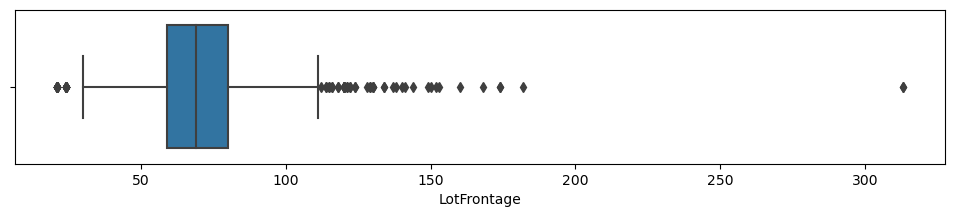

In [21]:
plt.figure(figsize = [12, 2])
sns.boxplot(x = train_df['LotFrontage'])
plt.show()

In [22]:
def dist(data) :
    mean_val = train_df[data].mean() 
    median_val = train_df[data].median()
    mode_val = train_df[data].mode()[0]
    
    sns.histplot(train_df[data], kde=False, color='lightblue')
    plt.axvline(mean_val, color='red', linestyle='--', label='Mean')
    plt.axvline(median_val, color='green', linestyle='--', label='Median')
    plt.axvline(mode_val, color='blue', linestyle='--', label='Mode')
    plt.xticks(rotation = 45)
    plt.legend()

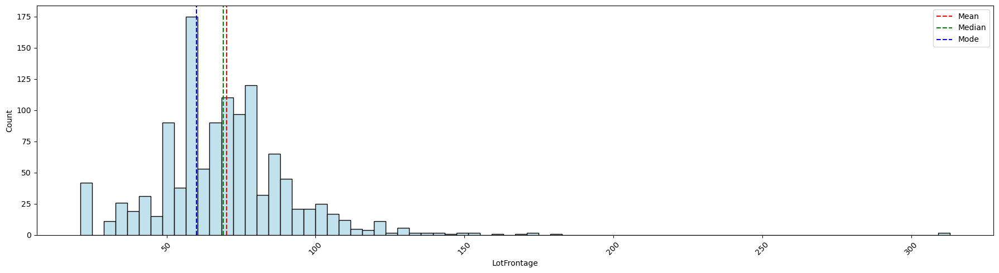

In [23]:
plt.figure(figsize=[18, 5])
dist('LotFrontage')
plt.tight_layout()
plt.show()

    - As the LotFrontage has some outliers so have to treat it towards the median value so am taking the help of
        Inter Quartile Range (IQR)

In [24]:
train_df['LotFrontage'] = train_df['LotFrontage'].replace(np.nan, train_df.LotFrontage.median())

In [25]:
train_df['LotFrontage'] = train_df['LotFrontage'].astype(int)

<Axes: ylabel='LotFrontage'>

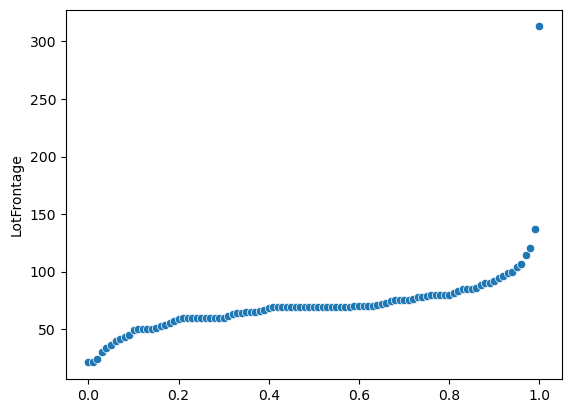

In [26]:
sns.scatterplot(train_df['LotFrontage'].quantile(np.arange(0, 1.01, 0.01) ))

In [27]:
def outlier_remover(col) :
    q1 = col.quantile(0.25)
    q3 = col.quantile(0.75)
    iqr = q3 - q1
    lower_limit = q1 - 1.5 * iqr
    upper_limit = q3 + 1.5 * iqr
    col[col < lower_limit] = lower_limit
    col[col > upper_limit] = upper_limit
    return col

In [28]:
train_df['LotFrontage'] = outlier_remover(train_df['LotFrontage'])

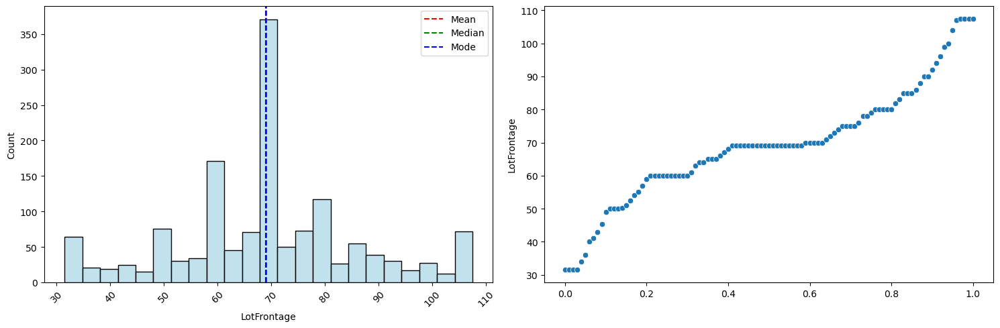

In [29]:
plt.figure(figsize=[15, 5])
plt.subplot(1, 2, 1)
dist('LotFrontage')
plt.subplot(1, 2, 2)
sns.scatterplot(train_df['LotFrontage'].quantile(np.arange(0, 1.01, 0.01)))
plt.tight_layout()
plt.show()

In [30]:
test_df['LotFrontage'] = test_df['LotFrontage'].replace(np.nan, test_df.LotFrontage.median())
test_df['LotFrontage'] = test_df['LotFrontage'].astype(int)

<Axes: ylabel='LotFrontage'>

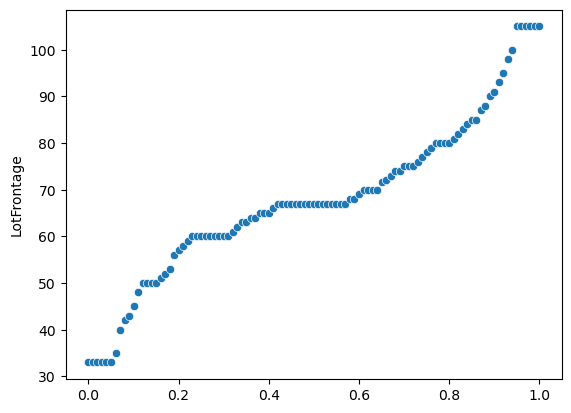

In [31]:
test_df['LotFrontage'] = outlier_remover(test_df['LotFrontage'])
sns.scatterplot(test_df['LotFrontage'].quantile(np.arange(0, 1.01, 0.01) ))

    Now LotFrontage is now clear now lets check another NULL containing features.

In [32]:
val = null_counter(train_df)['column name'].tolist()

In [33]:
train_df[val]

,GarageType,GarageCond,GarageYrBlt,GarageFinish,GarageQual,BsmtFinType2,BsmtExposure,BsmtFinType1,BsmtCond,BsmtQual,MasVnrArea,Electrical
0,Attchd,TA,2003.00,RFn,TA,Unf,No,GLQ,TA,Gd,196.00,SBrkr
1,Attchd,TA,1976.00,RFn,TA,Unf,Gd,ALQ,TA,Gd,0.00,SBrkr
2,Attchd,TA,2001.00,RFn,TA,Unf,Mn,GLQ,TA,Gd,162.00,SBrkr
3,Detchd,TA,1998.00,Unf,TA,Unf,No,ALQ,Gd,TA,0.00,SBrkr
4,Attchd,TA,2000.00,RFn,TA,Unf,Av,GLQ,TA,Gd,350.00,SBrkr
...,...,...,...,...,...,...,...,...,...,...,...,...
1455,Attchd,TA,1999.00,RFn,TA,Unf,No,Unf,TA,Gd,0.00,SBrkr
1456,Attchd,TA,1978.00,Unf,TA,Rec,No,ALQ,TA,Gd,119.00,SBrkr
1457,Attchd,TA,1941.00,RFn,TA,Unf,No,GLQ,Gd,TA,0.00,SBrkr
1458,Attchd,TA,1950.00,Unf,TA,Rec,Mn,GLQ,TA,TA,0.00,FuseA


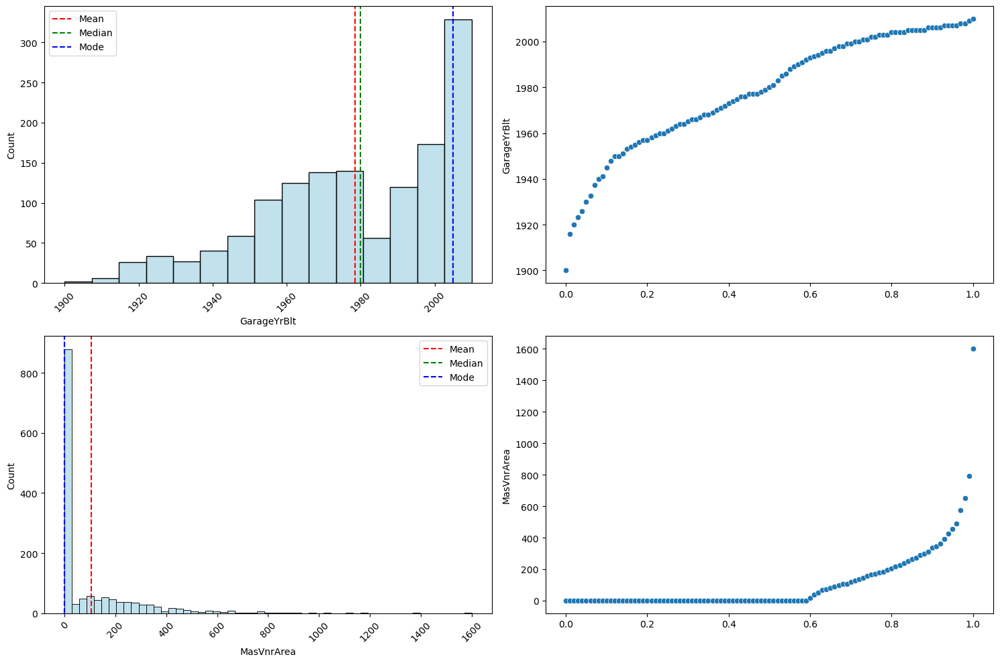

In [34]:
plt.figure(figsize=[15, 10])
plt.subplot(2, 2, 1)
dist('GarageYrBlt')
plt.subplot(2, 2, 2)
sns.scatterplot(train_df['GarageYrBlt'].quantile(np.arange(0, 1.01, 0.01)))
plt.subplot(2, 2, 3)
dist('MasVnrArea')
plt.subplot(2, 2, 4)
sns.scatterplot(train_df['MasVnrArea'].quantile(np.arange(0, 1.01, 0.01)))
plt.tight_layout()
plt.show()

<Axes: ylabel='MasVnrArea'>

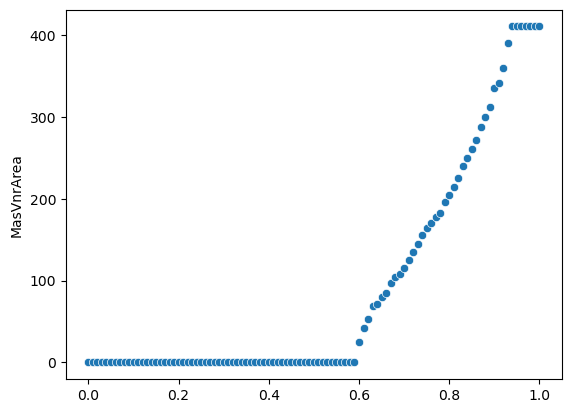

In [35]:
train_df['GarageYrBlt'] = train_df['GarageYrBlt'].replace(np.nan, train_df.LotFrontage.median())
train_df['MasVnrArea'] = train_df['MasVnrArea'].replace(np.nan, train_df.LotFrontage.median())
train_df['MasVnrArea'] = train_df['MasVnrArea'].astype(int)
train_df['MasVnrArea'] = outlier_remover(train_df['MasVnrArea'])
sns.scatterplot(train_df['MasVnrArea'].quantile(np.arange(0, 1.01, 0.01) ))

In [36]:
test_df['GarageYrBlt'] = test_df['GarageYrBlt'].replace(np.nan, test_df.LotFrontage.median())
test_df['MasVnrArea'] = test_df['MasVnrArea'].replace(np.nan, test_df.LotFrontage.median())
test_df['MasVnrArea'] = test_df['MasVnrArea'].astype(int)
test_df['MasVnrArea'] = outlier_remover(test_df['MasVnrArea'])

In [37]:
def categorical_dist(data):
    mode_val = train_df[data].mode()[0]
    category_counts = train_df[data].value_counts()
    colors = sns.color_palette("Set2", len(category_counts))
    sns.barplot(x=category_counts.index, y=category_counts.values, palette=colors)
    plt.xlabel(data)
    plt.ylabel('Count')
    plt.title(f'Distribution of {data}')
    plt.xticks(rotation=45)
    plt.show()

In [38]:
cat_list = ['GarageType', 'GarageCond', 'GarageFinish', 'GarageQual', 
            'BsmtFinType2', 'BsmtExposure', 'BsmtFinType1', 'BsmtCond', 'BsmtQual', 'Electrical']

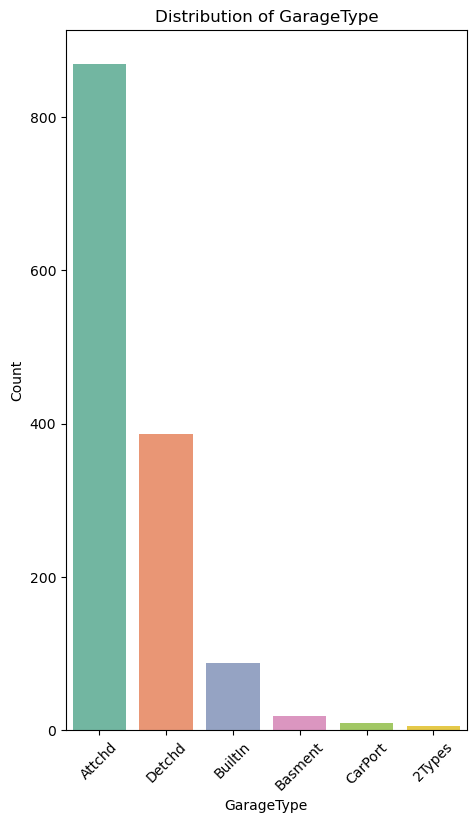

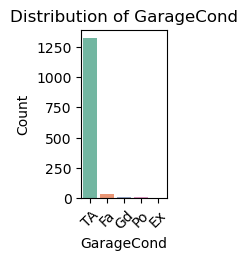

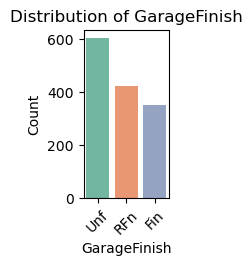

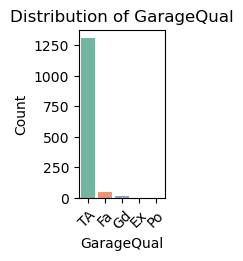

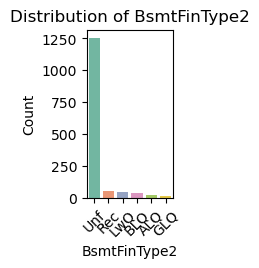

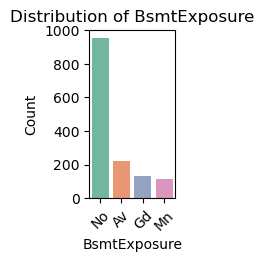

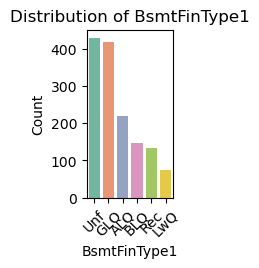

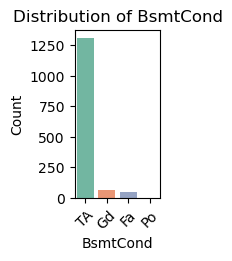

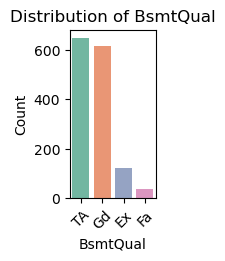

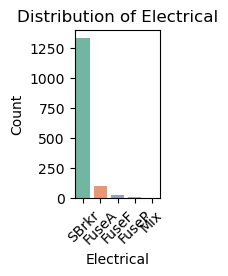

<Figure size 640x480 with 0 Axes>

In [39]:
plt.figure(figsize=[30, 20])

plt.subplot(2, 5, 1)
categorical_dist(cat_list[0])
plt.subplot(2, 5, 2)
categorical_dist(cat_list[1])
plt.subplot(2, 5, 3)
categorical_dist(cat_list[2])
plt.subplot(2, 5, 4)
categorical_dist(cat_list[3])
plt.subplot(2, 5, 5)
categorical_dist(cat_list[4])
plt.subplot(2, 5, 6)
categorical_dist(cat_list[5])
plt.subplot(2, 5, 7)
categorical_dist(cat_list[6])
plt.subplot(2, 5, 8)
categorical_dist(cat_list[7])
plt.subplot(2, 5, 9)
categorical_dist(cat_list[8])
plt.subplot(2, 5, 10)
categorical_dist(cat_list[9])

plt.tight_layout()
plt.show()

    There isn't so much NULL values so am replacing all the categorical null values with mode of each features 
    for both train and tets Dataset.

In [40]:
val = null_counter(train_df)['column name'].tolist()
val

['GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'BsmtExposure',
 'BsmtFinType2',
 'BsmtFinType1',
 'BsmtQual',
 'BsmtCond',
 'Electrical']

In [41]:
def filler(data, features) :
    for col in data.columns :
        if col in features :
            data[col] = data[col].replace(np.nan, data[col].mode()[0])

In [42]:
filler(train_df, val)

In [43]:
val = null_counter(test_df)['column name'].tolist()
filler(test_df, val)

In [44]:
null_counter(train_df)

,column name,total count,percentage


In [45]:
null_counter(test_df)

,column name,total count,percentage


    Now all the missing or NULL values from some features are being imputed or solved
        The all features are mostly upto 40% or more null is being dropped
        and the values which are less than 5% are bening imputed by mode values 
        NOW, 
            let's shift upon to next step as EDA (Exploratory Data Analysis) and Feature Selection and Engineering.

#### Exploratory Data Analysis.

In [46]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.00,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.00,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.00,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.00,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.00,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.00,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.00,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.00,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.00,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.00,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000


    Encoding the features to get actual categorical and Numerical Values.

In [47]:
feature_dictionary = {
    'MSSubClass': {
        20: "1-STORY 1946 & NEWER ALL STYLES",
        30: "1-STORY 1945 & OLDER",
        40: "1-STORY W/FINISHED ATTIC ALL AGES",
        45: "1-1/2 STORY - UNFINISHED ALL AGES",
        50: "1-1/2 STORY FINISHED ALL AGES",
        60: "2-STORY 1946 & NEWER",
        70: "2-STORY 1945 & OLDER",
        75: "2-1/2 STORY ALL AGES",
        80: "SPLIT OR MULTI-LEVEL",
        85: "SPLIT FOYER",
        90: "DUPLEX - ALL STYLES AND AGES",
        120: "1-STORY PUD (1946 & NEWER)",
        150: "1-1/2 STORY PUD - ALL AGES",
        160: "2-STORY PUD (1946 & NEWER)",
        180: "PUD - MULTILEVEL",
        190: "2 FAMILY CONVERSION - ALL STYLES AND AGES"
    },
    'MSZoning': {
        'A': "Agriculture",
        'C': "Commercial",
        'FV': "Floating Village Residential",
        'I': "Industrial",
        'RH': "Residential High Density",
        'RL': "Residential Low Density",
        'RP': "Residential Low Density Park",
        'RM': "Residential Medium Density"
    },
    'Street': {
        'Grvl': "Gravel",
        'Pave': "Paved"
    },
    'Alley': {
        'Grvl': "Gravel",
        'Pave': "Paved",
        'NA': "No alley access"
    },
    'LotShape': {
        'Reg': "Regular",
        'IR1': "Slightly irregular",
        'IR2': "Moderately Irregular",
        'IR3': "Irregular"
    },
    'LandContour': {
        'Lvl': "Near Flat/Level",
        'Bnk': "Banked - Quick rise",
        'HLS': "Hillside - Significant slope",
        'Low': "Depression"
    },
    'Utilities': {
        'AllPub': "All public utilities",
        'NoSewr': "Electricity, Gas, Water (Septic)",
        'NoSeWa': "Electricity and Gas only",
        'ELO': "Electricity only"
    },
    'LotConfig': {
        'Inside': "Inside lot",
        'Corner': "Corner lot",
        'CulDSac': "Cul-de-sac",
        'FR2': "Frontage on 2 sides",
        'FR3': "Frontage on 3 sides"
    },
    'LandSlope': {
        'Gtl': "Gentle slope",
        'Mod': "Moderate slope",
        'Sev': "Severe slope"
    },
    'Neighborhood': {
        'Blmngtn': "Bloomington Heights",
        'Blueste': "Bluestem",
        'BrDale': "Briardale",
        'BrkSide': "Brookside",
        'ClearCr': "Clear Creek",
        'CollgCr': "College Creek",
        'Crawfor': "Crawford",
        'Edwards': "Edwards",
        'Gilbert': "Gilbert",
        'IDOTRR': "Iowa DOT and Rail Road",
        'MeadowV': "Meadow Village",
        'Mitchel': "Mitchell",
        'Names': "North Ames",
        'NoRidge': "Northridge",
        'NPkVill': "Northpark Villa",
        'NridgHt': "Northridge Heights",
        'NWAmes': "Northwest Ames",
        'OldTown': "Old Town",
        'SWISU': "South & West of Iowa State University",
        'Sawyer': "Sawyer",
        'SawyerW': "Sawyer West",
        'Somerst': "Somerset",
        'StoneBr': "Stone Brook",
        'Timber': "Timberland",
        'Veenker': "Veenker"
    },
    'Condition1': {
        'Artery': "Adjacent to arterial street",
        'Feedr': "Adjacent to feeder street",
        'Norm': "Normal",
        'RRNn': "Near North-South Railroad",
        'RRAn': "Adjacent to North-South Railroad",
        'PosN': "Near positive off-site feature",
        'PosA': "Adjacent to positive off-site feature",
        'RRNe': "Near East-West Railroad",
        'RRAe': "Adjacent to East-West Railroad"
    },
    'BldgType': {
        '1Fam': "Single-family Detached",
        '2FmCon': "Two-family Conversion",
        'Duplx': "Duplex",
        'TwnhsE': "Townhouse End Unit",
        'TwnhsI': "Townhouse Inside Unit"
    },
    'HouseStyle': {
        '1Story': "One story",
        '1.5Fin': "One and one-half story (finished)",
        '1.5Unf': "One and one-half story (unfinished)",
        '2Story': "Two story",
        '2.5Fin': "Two and one-half story (finished)",
        '2.5Unf': "Two and one-half story (unfinished)",
        'SFoyer': "Split Foyer",
        'SLvl': "Split Level"
    },
    'Heating': {
        'Floor': "Floor Furnace",
        'GasA': "Gas forced warm air furnace",
        'GasW': "Gas hot water or steam heat",
        'Grav': "Gravity furnace",
        'OthW': "Hot water or steam heat other than gas",
        'Wall': "Wall furnace"
    },
    'CentralAir': {
        'N': "No",
        'Y': "Yes"
    },
    'FireplaceQu': {
        'Ex': "Excellent",
        'Gd': "Good",
        'TA': "Average",
        'Fa': "Fair",
        'Po': "Poor",
        'NA': "No Fireplace"
    },
    'GarageType': {
        '2Types': "More than one type of garage",
        'Attchd': "Attached to home",
        'Basment': "Basement Garage",
        'BuiltIn': "Built-In garage",
        'CarPort': "Car Port",
        'Detchd': "Detached from home",
        'NA': "No Garage"
    },
    'SaleType': {
        'WD': "Warranty Deed - Conventional",
        'CWD': "Warranty Deed - Cash",
        'VWD': "Warranty Deed - VA Loan",
        'New': "Home just constructed and sold",
        'COD': "Court Officer Deed/Estate",
        'Con': "Contract 15% Down payment",
        'Oth': "Other"
    },
    'SaleCondition': {
        'Normal': "Normal Sale",
        'Abnorml': "Abnormal Sale",
        'AdjLand': "Adjoining Land Purchase",
        'Alloca': "Allocation - linked properties",
        'Family': "Sale between family members",
        'Partial': "Home not completed when assessed"
    }
}

    >> Seperating the Categorcal and Numerical for Better Visualization and 
        Feature Selecion

In [48]:
num_vars = train_df.select_dtypes(include='number')
cat_vars = train_df.select_dtypes(exclude='number')

In [49]:
num_vars.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.00,8450,7,5,2003,2003,196.00,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.00,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.00,9600,6,8,1976,1976,0.00,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.00,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.00,11250,7,5,2001,2002,162.00,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.00,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.00,9550,7,5,1915,1970,0.00,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.00,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.00,14260,8,5,2000,2000,350.00,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.00,3,836,192,84,0,0,0,0,0,12,2008,250000


In [50]:
cat_vars.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


    - Exploratory Data Analysis (EDA) on Numerical data.

In [51]:
num_values = num_vars.columns.tolist()

In [52]:
len(num_values)

38

In [53]:
oky = 4 * len(num_values)
oky

152

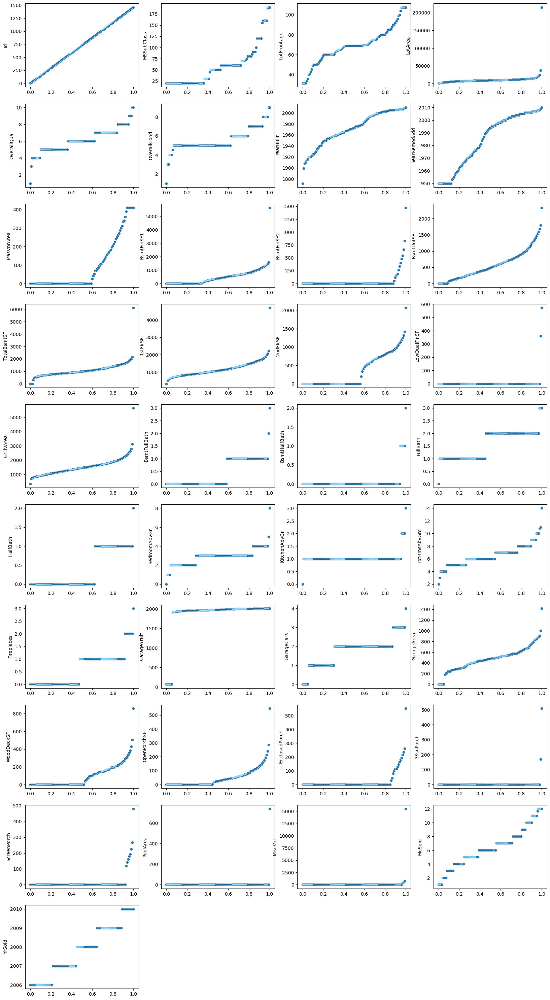

In [54]:
plt.figure(figsize = [20, len(num_values)])
for i in range(0, 37) :
    plt.subplot(10, 4, i+1)
    sns.scatterplot(train_df[num_values[i]].quantile(np.arange(0, 1.01, 0.01)))

In [55]:
for i in num_values:
    train_df[i] = outlier_remover(train_df[i])

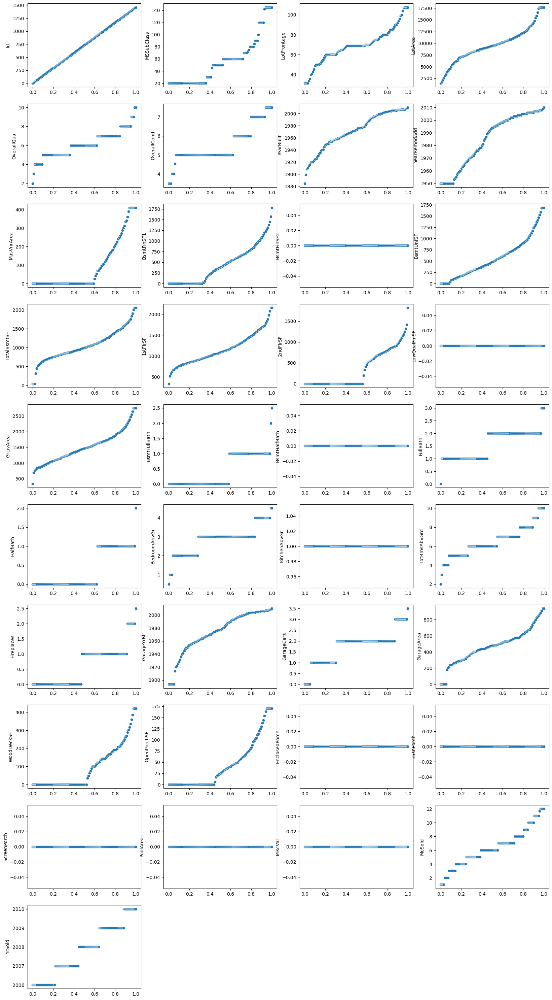

In [56]:
plt.figure(figsize = [20, len(num_values)])
for i in range(0, 37) :
    plt.subplot(10, 4, i+1)
    sns.scatterplot(train_df[num_values[i]].quantile(np.arange(0, 1.01, 0.01)))

    >> As outliers were the major reasons that are affecting the values so decided to 
        deal them so that to work pon feature selection.

    Now analysing each numeric column one by one as per need. 

In [57]:
train_df.describe().round(2).style.format(precision=2).background_gradient(cmap="Blues")

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00
mean,730.50,55.09,69.09,9647.39,6.10,5.54,1971.30,1984.87,89.78,440.00,0.00,563.78,1050.25,1157.02,346.79,0.00,1503.74,0.42,0.00,1.57,0.38,2.85,1.00,6.49,0.61,1973.79,1.77,470.67,91.81,42.60,0.00,0.00,0.00,0.00,0.00,6.32,2007.82,177331.53
std,421.61,37.51,17.23,3594.36,1.38,0.96,30.11,20.65,133.86,433.22,0.00,431.71,397.94,362.58,435.79,0.00,481.38,0.52,0.00,0.55,0.50,0.76,0.00,1.54,0.64,30.90,0.74,207.11,116.66,52.50,0.00,0.00,0.00,0.00,0.00,2.70,1.33,67205.84
min,1.00,20.00,31.50,1481.50,2.00,3.50,1885.00,1950.00,0.00,0.00,0.00,0.00,42.00,334.00,0.00,0.00,334.00,0.00,0.00,0.00,0.00,0.50,1.00,2.00,0.00,1893.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,2006.00,34900.00
25%,365.75,20.00,60.00,7553.50,5.00,5.00,1954.00,1967.00,0.00,0.00,0.00,223.00,795.75,882.00,0.00,0.00,1129.50,0.00,0.00,1.00,0.00,2.00,1.00,5.00,0.00,1958.00,1.00,334.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,2007.00,129975.00
50%,730.50,50.00,69.00,9478.50,6.00,5.00,1973.00,1994.00,0.00,383.50,0.00,477.50,991.50,1087.00,0.00,0.00,1464.00,0.00,0.00,2.00,0.00,3.00,1.00,6.00,1.00,1977.00,2.00,480.00,0.00,25.00,0.00,0.00,0.00,0.00,0.00,6.00,2008.00,163000.00
75%,1095.25,70.00,79.00,11601.50,7.00,6.00,2000.00,2004.00,164.25,712.25,0.00,808.00,1298.25,1391.25,728.00,0.00,1776.75,1.00,0.00,2.00,1.00,3.00,1.00,7.00,1.00,2001.00,2.00,576.00,168.00,68.00,0.00,0.00,0.00,0.00,0.00,8.00,2009.00,214000.00
max,1460.00,145.00,107.50,17673.50,10.00,7.50,2010.00,2010.00,410.62,1780.62,0.00,1685.50,2052.00,2155.12,1820.00,0.00,2747.62,2.50,0.00,3.00,2.00,4.50,1.00,10.00,2.50,2010.00,3.50,938.25,420.00,170.00,0.00,0.00,0.00,0.00,0.00,12.00,2010.00,340037.50


    **A few points to notice in these Described values**

    There are more columns that are just useless for our model prediction and analysis
    so dropping them by their linearity check
    

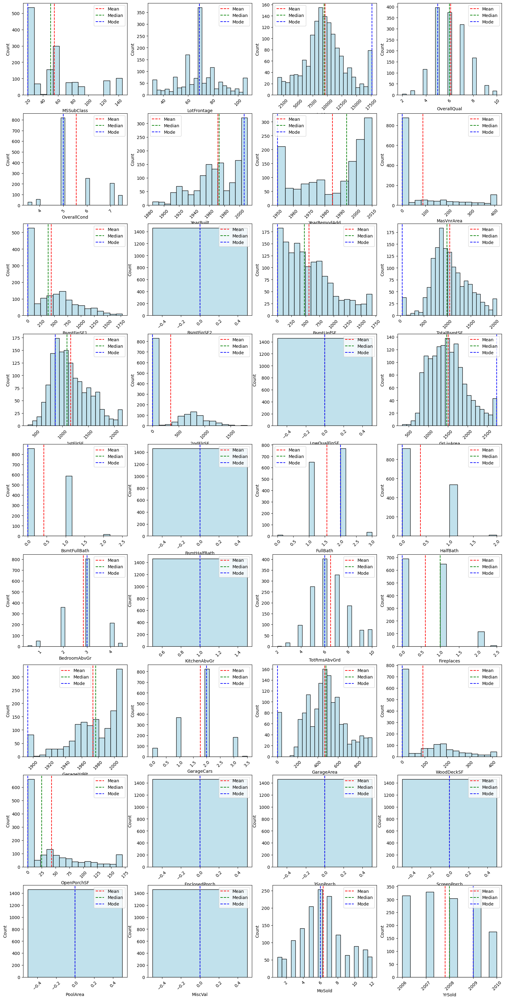

In [58]:
plt.figure(figsize = [20, 1.2*len(num_values)])
for i in range(0, 36) :
    plt.subplot(10, 4, i+1)
    dist(num_values[i+1])

    Feature Selection for Numerical Features and why are the importance.
        1. Checking there values is there appropriate or not.
        2. Finding the Data Imbalance is there any imbalance in data, or not for maximum features.
        3. At last their distribution according to the values. and more charts to visualize their importance.

In [59]:
num_vars.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.00,8450,7,5,2003,2003,196.00,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.00,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.00,9600,6,8,1976,1976,0.00,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.00,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.00,11250,7,5,2001,2002,162.00,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.00,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.00,9550,7,5,1915,1970,0.00,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.00,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.00,14260,8,5,2000,2000,350.00,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.00,3,836,192,84,0,0,0,0,0,12,2008,250000


    So Selecting Some Features from Domain Based Archiecture as the features are too much so only choosing the beat one :
        1. BY Numerical Values Selecting the features that are most giving the Sale in Price
        2. If any of the numerical features is ordinal so will decide on the value Counts.

In [60]:
num_vars['Id'].describe()

count   1460.00
mean     730.50
std      421.61
min        1.00
25%      365.75
50%      730.50
75%     1095.25
max     1460.00
Name: Id, dtype: float64

In [61]:
sns.set(style="whitegrid")

In [62]:
def scatter(val) :
    sns.scatterplot(data = train_df, x = val, y = 'SalePrice', alpha = 0.6)
    sns.regplot(data = train_df, x = val, y = 'SalePrice', scatter = False, color = 'red', line_kws = {'linestyle': '--'})
    plt.title('Scatter Plot of 1st Floor Area vs Sale Price', fontsize=16)
    plt.xlabel('1st Floor Area (sq ft)', fontsize=14)
    plt.ylabel('Sale Price ($)', fontsize=14)
    plt.xlim(0, train_df['1stFlrSF'].max() * 1.05)
    plt.ylim(0, train_df['SalePrice'].max() * 1.05)
    plt.grid(True)

def hist(val) :
    sns.histplot(
        data = train_df, x = val, weights = 'SalePrice',
        bins = 30, kde = False, color = 'brown'
    )

    plt.title(f'Histogram of {val} by SalePrice', fontsize=16)
    plt.xlabel('1st Floor Area (sq ft)', fontsize=14)
    plt.ylabel(f'Count by Sale Price', fontsize=14)

def box(val) :
    sns.boxplot(x = train_df[val])

def smp_scc(val) :    
    sns.scatterplot(train_df[val].quantile(np.arange(0, 1.01, 0.01)))

    As Given ID is a row deciding feature and am dropping this column as per no use.

In [63]:
num_vars.drop('Id', axis = 1, inplace = True)

In [64]:
num_vars['MSSubClass'].describe()

count   1460.00
mean      56.90
std       42.30
min       20.00
25%       20.00
50%       50.00
75%       70.00
max      190.00
Name: MSSubClass, dtype: float64

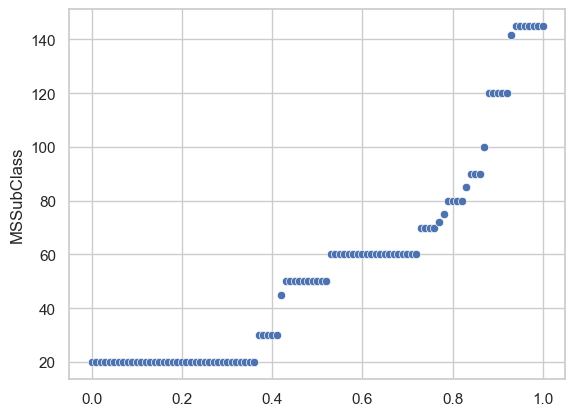

In [65]:
smp_scc('MSSubClass')

    MSSubClass is a numerical column with linear relationship.
        And it can be useful for us.
    AS MSSubClass : Identifies the type of dwelling involved in the sale.	

In [66]:
num_vars['LotFrontage'].describe()

count   1460.00
mean      69.09
std       17.23
min       31.50
25%       60.00
50%       69.00
75%       79.00
max      107.50
Name: LotFrontage, dtype: float64

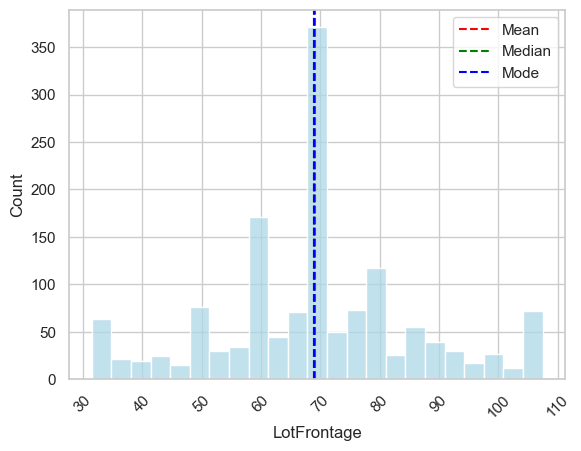

In [67]:
dist('LotFrontage')

    LotFrontage : Linear feet of street connected to property.
        LotFrontage measures the linear feet of street access connected to a property. It influences property 
        value and appeal, affecting visibility, accessibility, and the potential for landscaping or fencing.

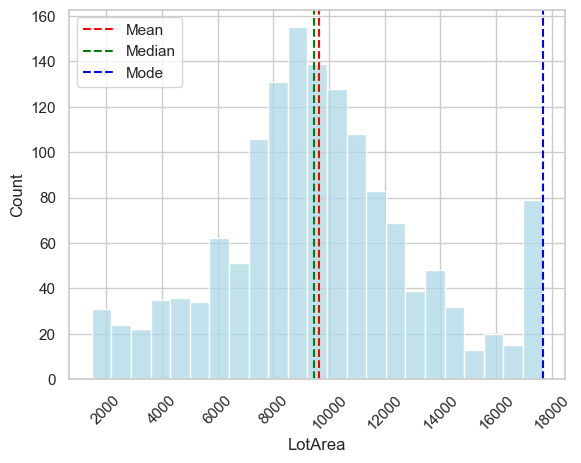

In [68]:
# num_vars['LotArea'].describe()
dist('LotArea')

    And there are lot more in the numerical values and the following charts determine how effective
    to us but there are major columns which are not so much important to us :-
        
    So am reemoving some columns in behalf of the predictions like.
        1. There are values having same value or only imbalanced data.
        2. There are some features having the Multicolliearity and the most important rule of the 
            Linear Regression of model is there shouldn't be any type of multicollinearity of columns.
        3. There should a linear relationship between dependent and independent variable and if any of the column isn't
            look like this can have to be removed.
            
    And by the end i have decided to remove some columns which must be removed by watching the values.

In [69]:
train_df[['SalePrice', 'OverallQual', 'OverallCond', 'GrLivArea', 'YearBuilt', 'TotalBsmtSF', 'FullBath', 'BedroomAbvGr', 'Neighborhood', 'GarageCars', 'KitchenQual', 'CentralAir']]

,SalePrice,OverallQual,OverallCond,GrLivArea,YearBuilt,TotalBsmtSF,FullBath,BedroomAbvGr,Neighborhood,GarageCars,KitchenQual,CentralAir
0,208500.00,7,5.00,1710.00,2003,856,2,3.00,CollgCr,2.00,Gd,Y
1,181500.00,6,7.50,1262.00,1976,1262,2,3.00,Veenker,2.00,TA,Y
2,223500.00,7,5.00,1786.00,2001,920,2,3.00,CollgCr,2.00,Gd,Y
3,140000.00,7,5.00,1717.00,1915,756,1,3.00,Crawfor,3.00,Gd,Y
4,250000.00,8,5.00,2198.00,2000,1145,2,4.00,NoRidge,3.00,Gd,Y
...,...,...,...,...,...,...,...,...,...,...,...,...
1455,175000.00,6,5.00,1647.00,1999,953,2,3.00,Gilbert,2.00,TA,Y
1456,210000.00,6,6.00,2073.00,1978,1542,2,3.00,NWAmes,2.00,TA,Y
1457,266500.00,7,7.50,2340.00,1941,1152,2,4.00,Crawfor,1.00,Gd,Y
1458,142125.00,5,6.00,1078.00,1950,1078,1,2.00,NAmes,1.00,Gd,Y


In [70]:
num_vars[["BsmtFinSF2", "LowQualFinSF", "BsmtHalfBath", "KitchenAbvGr", "EnclosedPorch", "3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal" ]]

,BsmtFinSF2,LowQualFinSF,BsmtHalfBath,KitchenAbvGr,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal
0,0,0,0,1,0,0,0,0,0
1,0,0,1,1,0,0,0,0,0
2,0,0,0,1,0,0,0,0,0
3,0,0,0,1,272,0,0,0,0
4,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
1455,0,0,0,1,0,0,0,0,0
1456,163,0,0,1,0,0,0,0,0
1457,0,0,0,1,0,0,0,0,2500
1458,1029,0,0,1,112,0,0,0,0


In [71]:
num_vars[["BsmtFinSF2", "LowQualFinSF", "BsmtHalfBath", "KitchenAbvGr", "EnclosedPorch", "3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal" ]].describe()

,BsmtFinSF2,LowQualFinSF,BsmtHalfBath,KitchenAbvGr,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal
count,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00
mean,46.55,5.84,0.06,1.05,21.95,3.41,15.06,2.76,43.49
std,161.32,48.62,0.24,0.22,61.12,29.32,55.76,40.18,496.12
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00
50%,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00
75%,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00
max,1474.00,572.00,2.00,3.00,552.00,508.00,480.00,738.00,15500.00


In [72]:
# print(num_vars["BsmtFinSF2"].value_counts())
# print(num_vars["LowQualFinSF"].value_counts())
# print(num_vars["BsmtHalfBath"].value_counts())
# print(num_vars["KitchenAbvGr"].value_counts())
# print(num_vars["EnclosedPorch"].value_counts())
# print(num_vars["3SsnPorch"].value_counts())
# print(num_vars["ScreenPorch"].value_counts())
# print(num_vars["PoolArea"].value_counts())
# print(num_vars["MiscVal"].value_counts())

drop_val = ["BsmtFinSF2", "LowQualFinSF", "BsmtHalfBath", "KitchenAbvGr", "EnclosedPorch", "3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal" ]
num_vars.drop(drop_val, inplace = True, axis = 1)

In [73]:
for i in num_values :
    if i in drop_val :
        num_values.remove(i)

In [74]:
# num_values

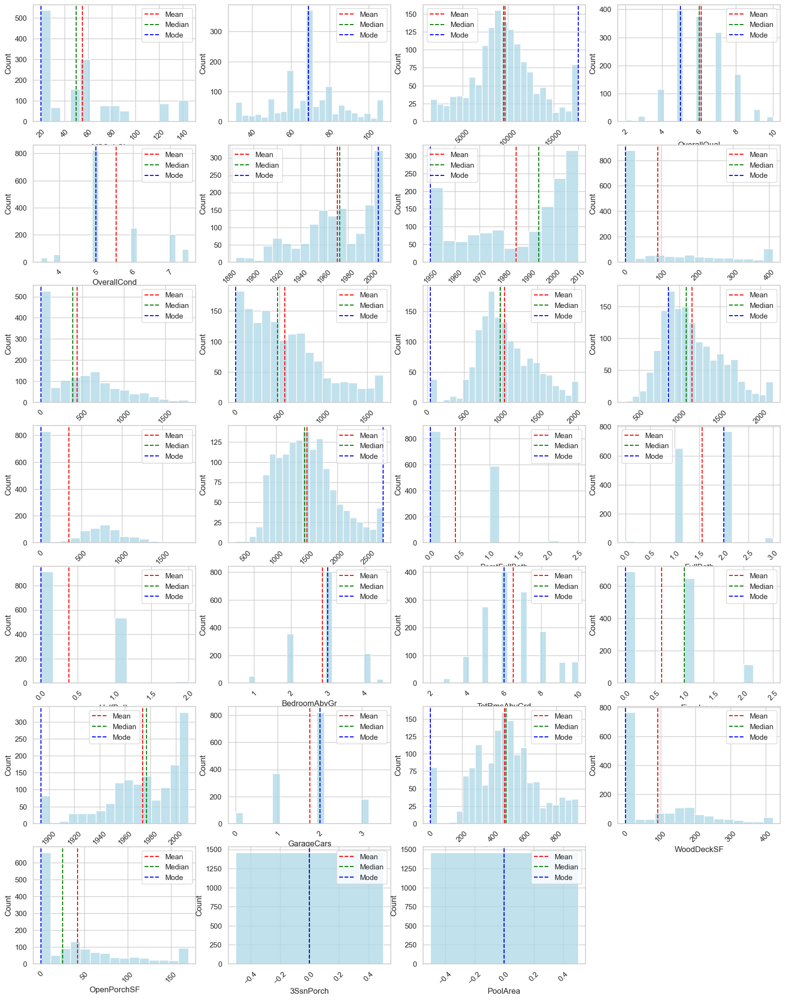

In [75]:
plt.figure(figsize = [20, 1.2*len(num_values)])
for i in range(0, 27) :
    plt.subplot(10, 4, i+1)
    dist(num_values[i+1])

    Now lets check some more column by VIF and extract out important column.

    There are more Columns which can be removed so working on them also.

In [76]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [77]:
vif_data = pd.DataFrame()
vif_data['Feature'] = num_vars.columns
vif_data['VIF'] = [variance_inflation_factor(num_vars.values, i) for i in range(num_vars.shape[1])]
vif_data.sort_values(by = "VIF", ascending = True)

,Feature,VIF
24,OpenPorchSF,1.80
23,WoodDeckSF,1.84
7,MasVnrArea,2.04
2,LotArea,2.61
19,Fireplaces,2.90
14,BsmtFullBath,3.36
16,HalfBath,3.40
0,MSSubClass,4.32
25,MoSold,6.59
8,BsmtFinSF1,17.88


In [78]:
high_vif_features = vif_data[vif_data['VIF'] > 5]['Feature']
high_vif_features = high_vif_features[high_vif_features != 'SalePrice']
num_vars.drop(columns = high_vif_features, errors = 'ignore', inplace = True)

In [79]:
num_vars

,MSSubClass,LotArea,MasVnrArea,BsmtFullBath,HalfBath,Fireplaces,WoodDeckSF,OpenPorchSF,SalePrice
0,60,8450,196.00,1,1,0,0,61,208500
1,20,9600,0.00,0,0,1,298,0,181500
2,60,11250,162.00,1,1,1,0,42,223500
3,70,9550,0.00,1,0,1,0,35,140000
4,60,14260,350.00,1,1,1,192,84,250000
...,...,...,...,...,...,...,...,...,...
1455,60,7917,0.00,0,1,1,0,40,175000
1456,20,13175,119.00,1,0,2,349,0,210000
1457,70,9042,0.00,0,0,2,0,60,266500
1458,20,9717,0.00,1,0,0,366,0,142125


In [80]:
num_vars = train_df[['SalePrice', 'OverallQual', 'OverallCond', 'GrLivArea', 'YearBuilt', 'TotalBsmtSF', 'FullBath', 'BedroomAbvGr', 'GarageCars']] 

In [81]:
num_vars

,SalePrice,OverallQual,OverallCond,GrLivArea,YearBuilt,TotalBsmtSF,FullBath,BedroomAbvGr,GarageCars
0,208500.00,7,5.00,1710.00,2003,856,2,3.00,2.00
1,181500.00,6,7.50,1262.00,1976,1262,2,3.00,2.00
2,223500.00,7,5.00,1786.00,2001,920,2,3.00,2.00
3,140000.00,7,5.00,1717.00,1915,756,1,3.00,3.00
4,250000.00,8,5.00,2198.00,2000,1145,2,4.00,3.00
...,...,...,...,...,...,...,...,...,...
1455,175000.00,6,5.00,1647.00,1999,953,2,3.00,2.00
1456,210000.00,6,6.00,2073.00,1978,1542,2,3.00,2.00
1457,266500.00,7,7.50,2340.00,1941,1152,2,4.00,1.00
1458,142125.00,5,6.00,1078.00,1950,1078,1,2.00,1.00


    Now the given Numerical values are being resolved or features are being selected
    now lets work on the categorical values.

In [82]:
cat_vars

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1456,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,Plywood,Plywood,TA,TA,CBlock,Gd,TA,No,ALQ,Rec,GasA,TA,Y,SBrkr,TA,Min1,Attchd,Unf,TA,TA,Y,WD,Normal
1457,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,CemntBd,CmentBd,Ex,Gd,Stone,TA,Gd,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1458,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,MetalSd,MetalSd,TA,TA,CBlock,TA,TA,Mn,GLQ,Rec,GasA,Gd,Y,FuseA,Gd,Typ,Attchd,Unf,TA,TA,Y,WD,Normal


In [83]:
def Barg(val):
    sns.barplot(
        x = cat_vars[val], 
        y = num_vars['SalePrice'], 
        palette = 'pastel', 
        errorbar = None
    )
    plt.title(f'Distribution of {val}', fontsize=18)
    plt.xlabel(f'{val}', fontsize=14)
    plt.ylabel('SalePrice', fontsize=14)
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()

In [84]:
def plotter(col) :
    plt.figure(figsize = [10, 8])
    plt.subplot(2, 2, 1)
    sns.barplot(
        x = cat_vars[col], 
        y = num_vars['SalePrice'], 
        estimator = np.mean, 
        ci = None, 
        order = cat_vars[col].value_counts().index
    )
    plt.title('Average Sale Price by Zoning Classification')
    plt.xticks(rotation = 45)
    plt.ylabel('Average Sale Price ($)')
    plt.xlabel('Zoning Classification')

    plt.subplot(2, 2, 2)
    cat_vars[col].value_counts().plot.pie(autopct='%1.1f%%', startangle=90)
    plt.title('Proportion of Utilities Available')
    plt.ylabel('')

    plt.subplot(2, 2, 3)
    sns.boxplot(
        x = cat_vars[col], 
        y = num_vars['SalePrice'], 
        order = cat_vars[col].value_counts().index
    )
    plt.title('Sale Price Distribution by Zoning Classification')
    plt.xticks(rotation=45)
    plt.xlabel('Zoning Classification')
    plt.ylabel('Sale Price')

    plt.subplot(2, 2, 4)

    plt.show()

In [85]:
cat_values = cat_vars.columns.tolist() 

In [86]:
# cat_values

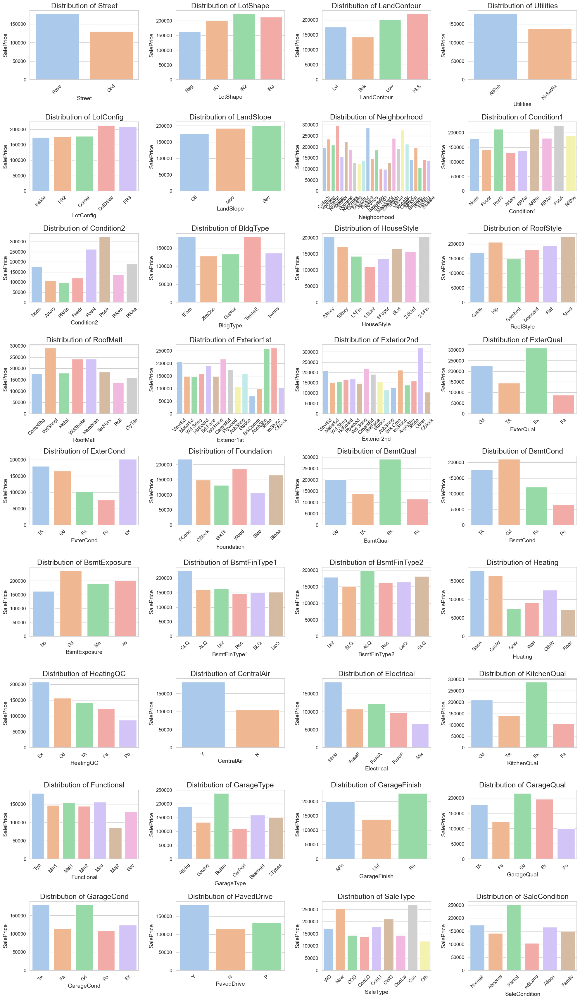

In [87]:
plt.figure(figsize = [20, 1.2*len(num_values)])
for i in range(0, 36) :
    plt.subplot(10, 4, i+1)
    Barg(cat_values[i+1])

    As we completely see in categorical values the values are distributed equally and we have some issues in selecting 
    the features for preprocessing and model building.
    
    So lets check wheather the given columns are useful in behalf of Domain.

    MSZoning
        Identifies the general zoning classification of the sale. This categorization can affect property use and 
    development potential but may not significantly impact price in certain markets.

        C: Commercial (All)
        FV: Floating Village Residential
        RH: Residential High Density
        RL: Residential Low Density
        RM: Residential Medium Density
    
    Importance: While zoning can guide development, its impact on price can vary. In some areas, zoning may be 
    less critical if residential demand is high across classifications.

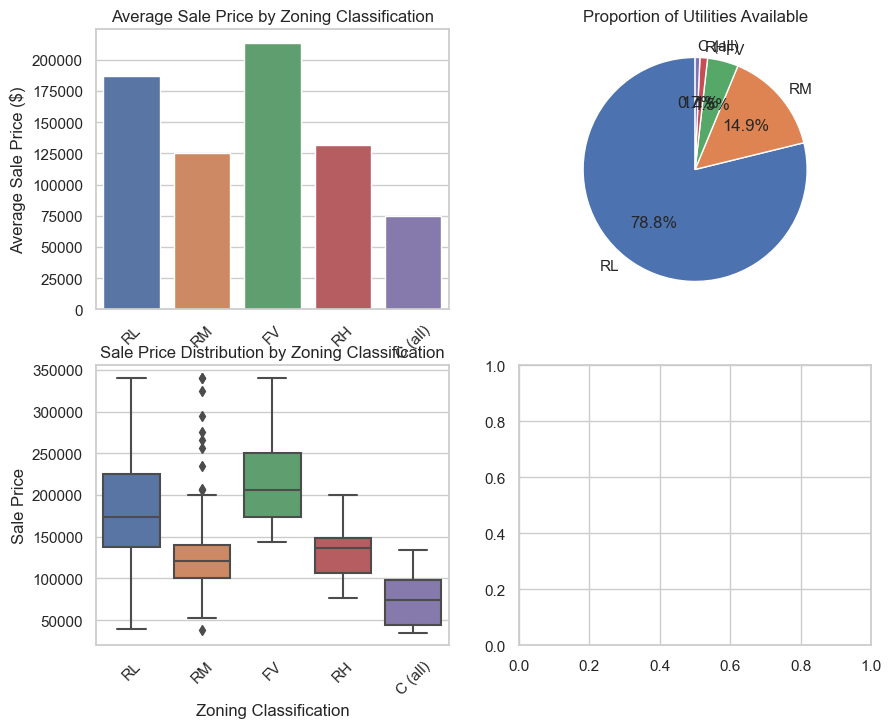

In [88]:
plotter('MSZoning')

    Street
        Refers to the type of road access to the property, which can influence desirability and access.

        Grvl: Gravel
        Pave: Paved
        
    Importance: Paved access generally indicates better accessibility and may enhance property value. 
    However, if both types are prevalent in the market, their individual impact might be negligible.

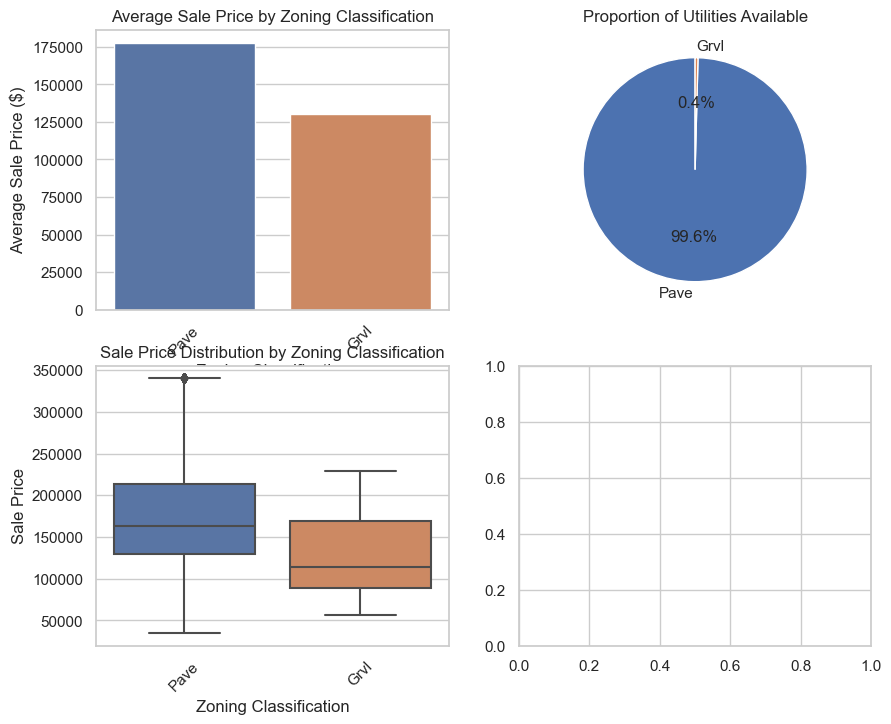

In [89]:
plotter('Street')

    LotShape
        Describes the general shape of the property, influencing usability and design.

        Reg: Regular
        IR1: Slightly irregular
        IR2: Moderately Irregular
        IR3: Irregular
        
    Importance: While shape can affect development potential, it may not significantly influence property value 
    in many cases, especially if other factors (like location) are more dominant.

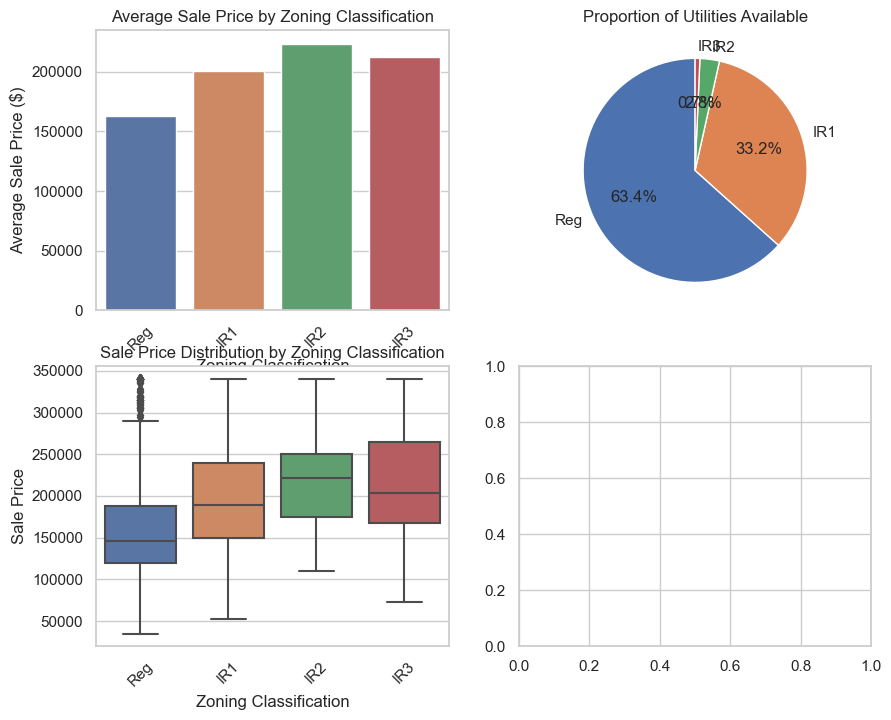

In [90]:
plotter('LotShape')

    LandSlope
        Describes the gradient of a property, which affects drainage, construction feasibility, and landscaping.

        Gtl: Gentle slope
        Mod: Moderate slope
        Sev: Severe slope
        
    Importance: Slope can be important, particularly for construction and drainage issues. Properties on severe 
    slopes may face additional costs, making this variable potentially impactful on pricing.



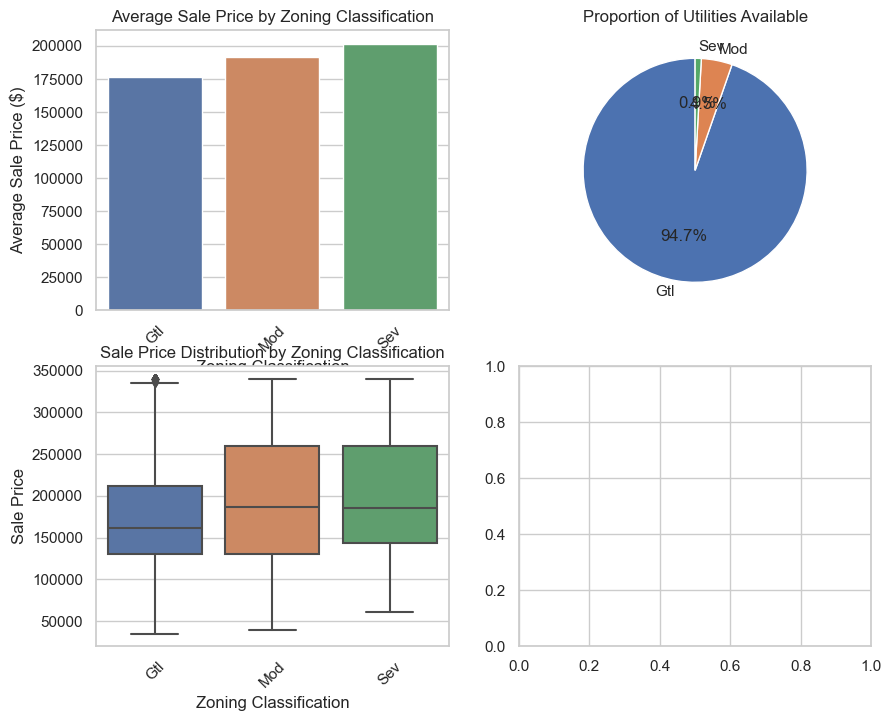

In [91]:
plotter('LandSlope')

    Neighborhood
        Identifies the physical locations within Ames city limits, reflecting community characteristics and amenities.

        Blmngtn: Bloomington Heights
        Blueste: Bluestem
        BrDale: Briardale
        (and others...)
        
    Importance: Neighborhood is often one of the most significant factors in determining property value due to 
    differing desirability, amenities, and market demand.

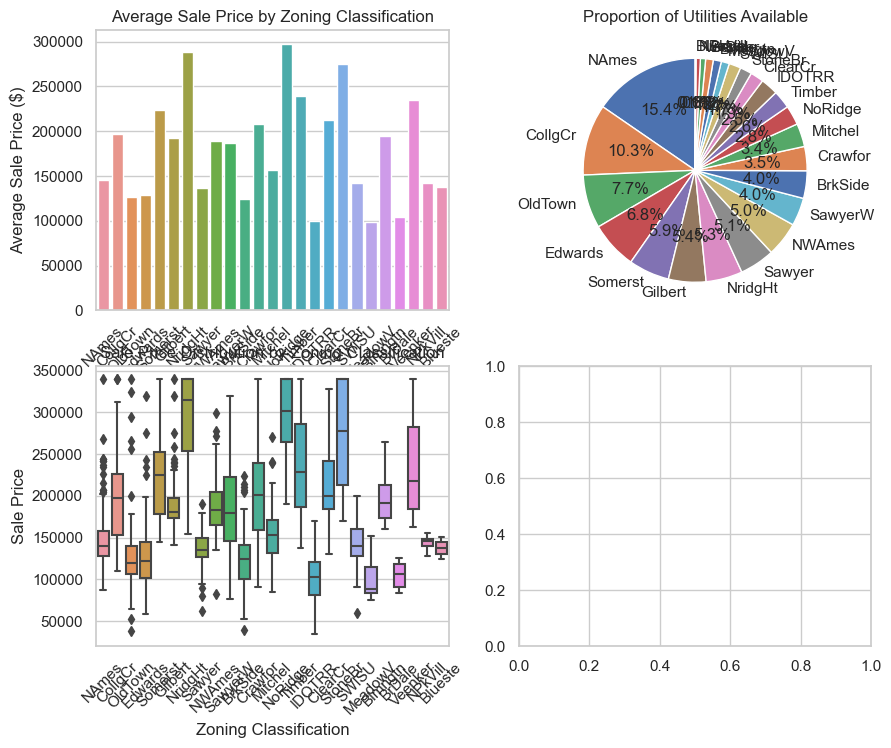

In [92]:
plotter('Neighborhood')

    Condition1
        Indicates the proximity to various conditions like main roads or railroads.

        Artery: Adjacent to arterial street
        Feedr: Adjacent to feeder street
        Norm: Normal
        (and others...)
        
    Importance: Proximity to main roads can enhance accessibility but may detract from privacy and tranquility.
    The overall impact can vary based on neighborhood context.

    Condition2
        Similar to Condition1, indicating additional proximity to conditions if applicable.

        Artery: Adjacent to arterial street
        Feedr: Adjacent to feeder street
        Norm: Normal
        (and others...)
        
    Importance: This variable provides additional context and can further influence the desirability and value
    of a property based on multiple nearby conditions.

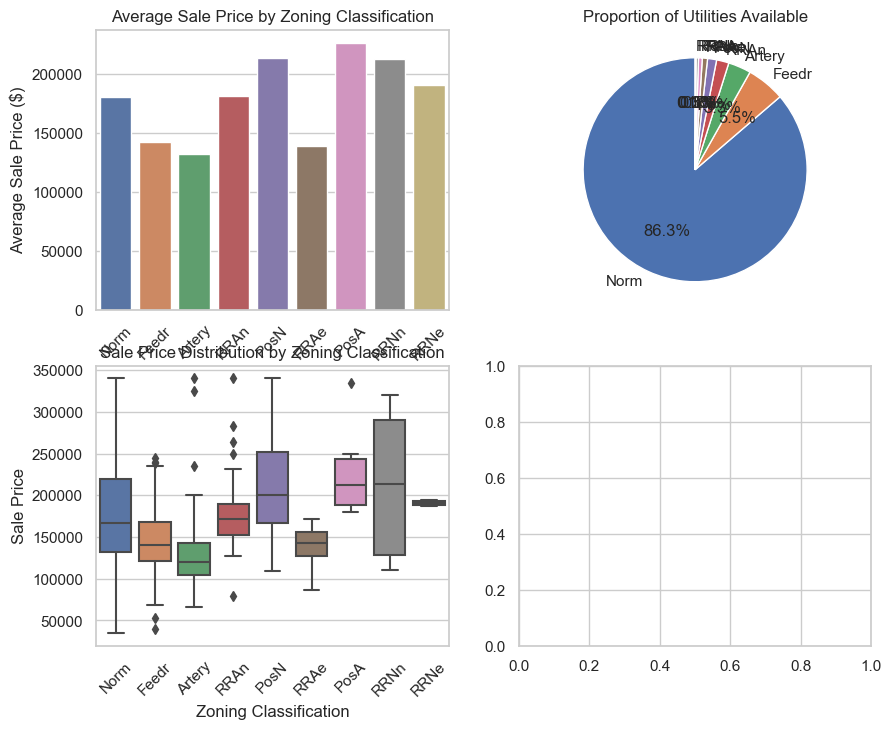

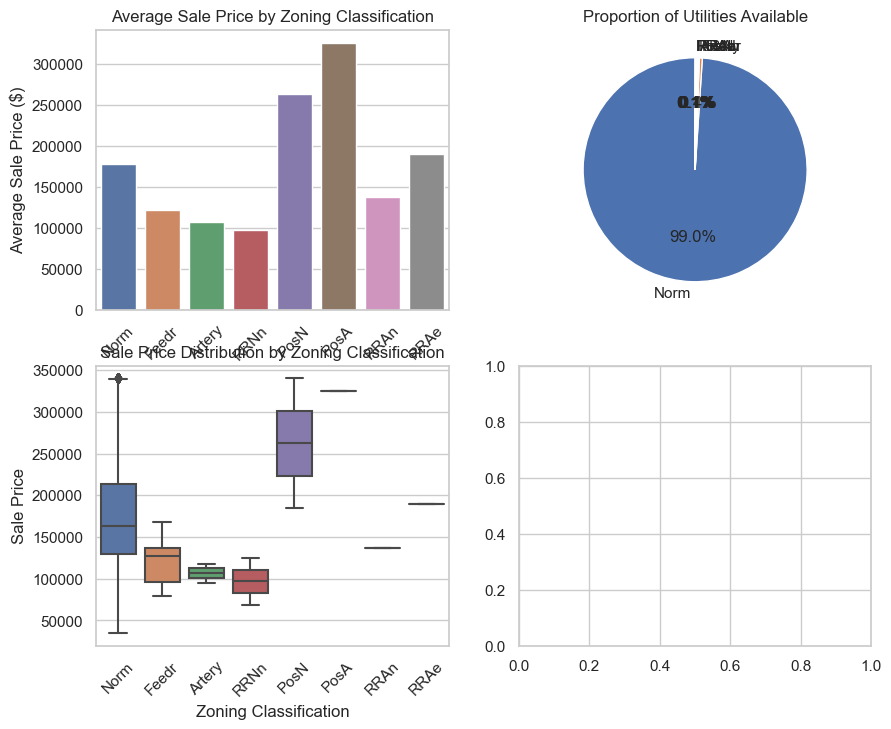

In [93]:
plotter('Condition1')
plotter('Condition2')

    BldgType
        Identifies the type of dwelling, affecting buyer preferences and valuation.

        1Fam: Single-family detached
        2FmCon: Two-family conversion; originally built as one-family dwelling
        Duplx: Duplex
        TwnhsE: Townhouse end unit
        TwnhsI: Townhouse inside unit
        
    Importance: The building type can significantly influence market appeal and pricing, as certain types are more
    desirable in different markets.

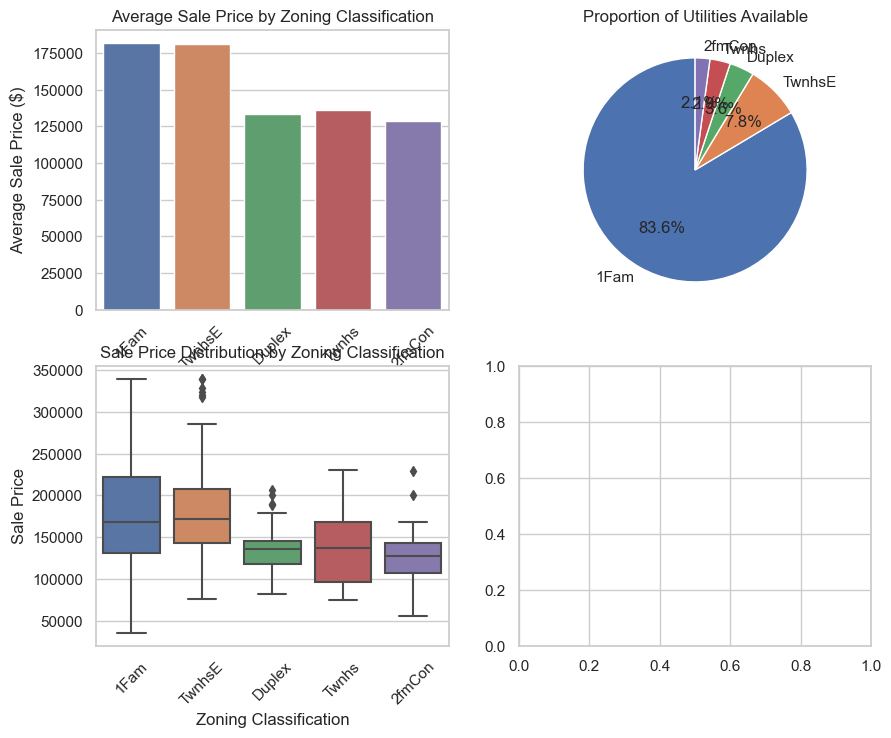

In [94]:
plotter('BldgType')

    HouseStyle
        Describes the architectural style of the dwelling, impacting aesthetic appeal.

        1Story: One story
        1.5Fin: One and one-half story: 2nd level finished
        2Story: Two story
        (and others...)
        
    Importance: House style can influence marketability and value, as buyers may have preferences for 
    certain architectural designs.

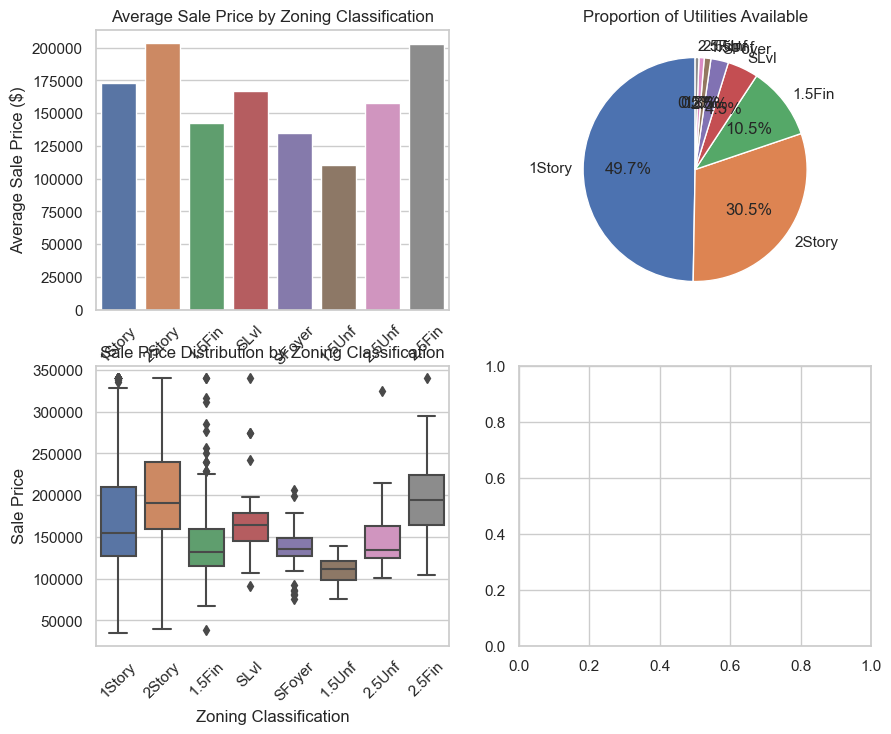

In [95]:
plotter('HouseStyle')

    ExterQual
        Rates the quality of exterior materials.

        Ex: Excellent
        Gd: Good
        TA: Average/Typical
        Fa: Fair
        Po: Poor
        
    Importance: The quality of exterior materials is critical for first impressions and can significantly 
    affect property value.

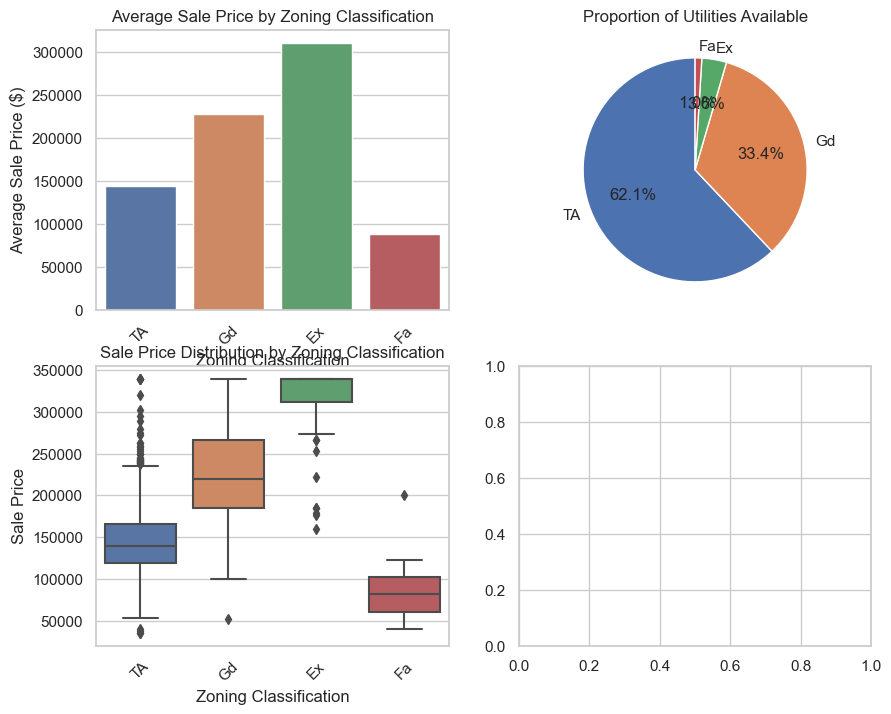

In [96]:
plotter('ExterQual')

    ExterCond
        Evaluates the present condition of the exterior material.

        Ex: Excellent
        Gd: Good
        TA: Average/Typical
        Fa: Fair
        Po: Poor
        
    Importance: Similar to ExterQual, this condition rating impacts buyer perceptions and, subsequently, the price

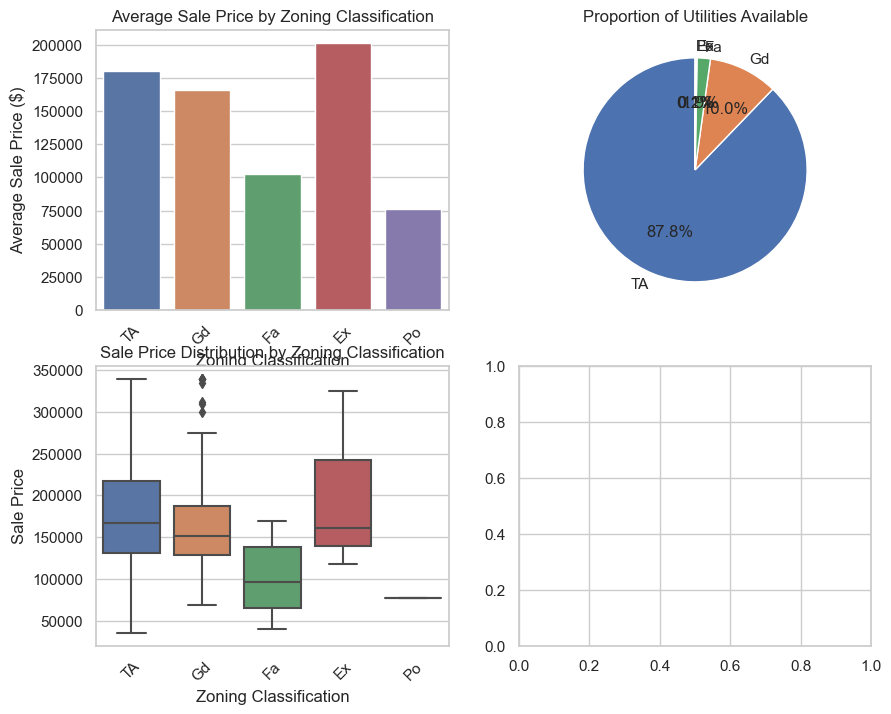

In [97]:
plotter('ExterCond')

    GarageType
        Indicates the location of the garage.

        2Types: More than one type of garage
        Attchd: Attached to home
        Detchd: Detached from home
        Basment: Basement garage
        CarPort: Carport
    
    Importance: Garage type affects functionality and desirability, influencing property value based on the market's preference for garage types.

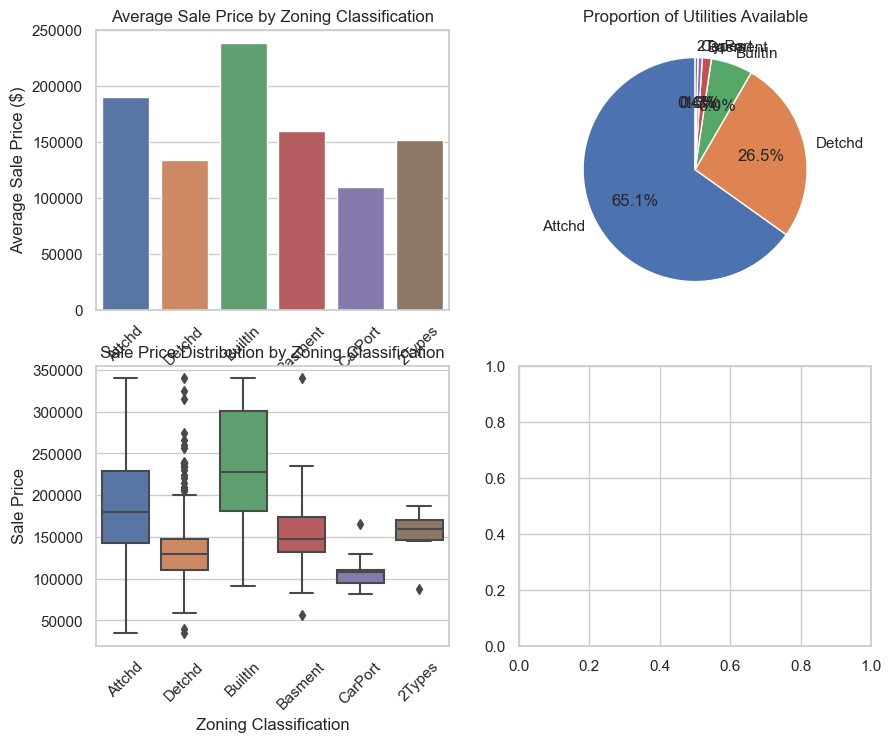

In [98]:
plotter('GarageType')

    GarageFinish
        Describes the interior finish of the garage.

        Fin: Finished
        RFn: Rough finished
        Unf: Unfinished
        NA: No garage
        
    Importance: A finished garage can be seen as an additional living space, enhancing property appeal and value.

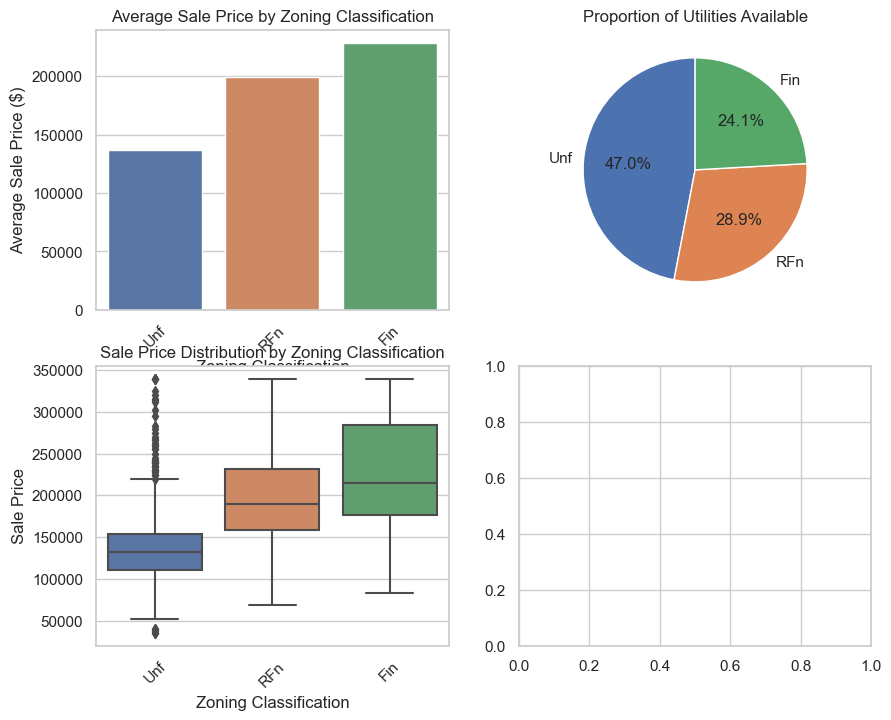

In [99]:
plotter('GarageFinish')

    SaleCondition
        Describes the condition of the sale.

        Normal: Normal Sale
        Abnorml: Abnormal Sale - trade, foreclosure, short sale
        (and others...)
        
    Importance: Sale condition can significantly affect the perceived value of a property and indicate underlying market trends.

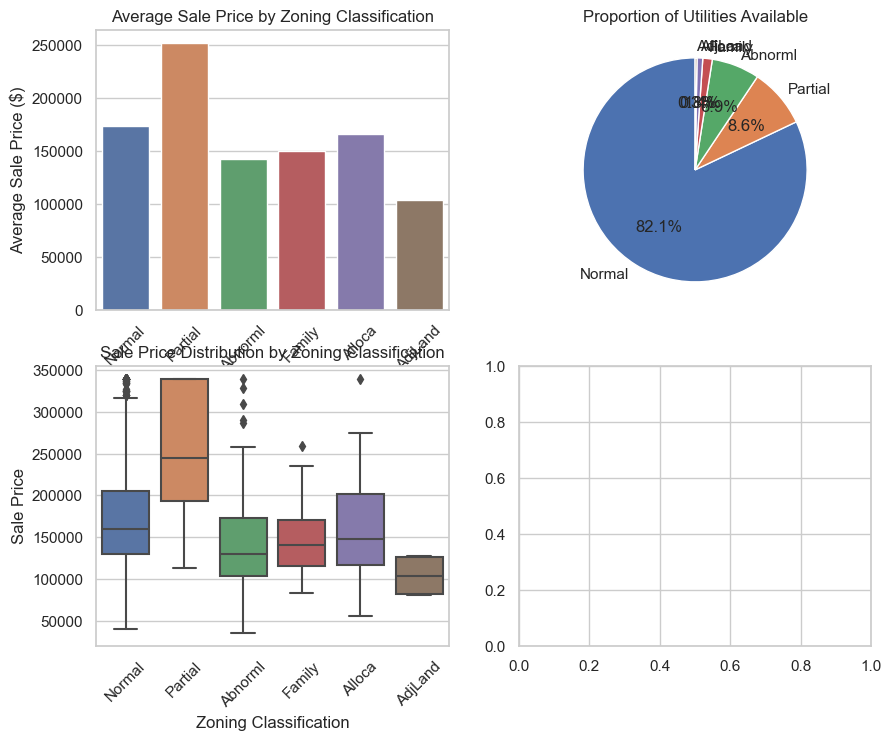

In [100]:
plotter('SaleCondition')

    Utilities
        Indicates the type of utilities available to the property.

        AllPub: All public utilities (electricity, water, sewer, gas)
        NoSewr: No sewer service
        NoWater: No water service
        ELO: Electricity only
        
    Importance: Access to full utilities can significantly enhance property value and desirability, as it impacts 
    livability and potential development.

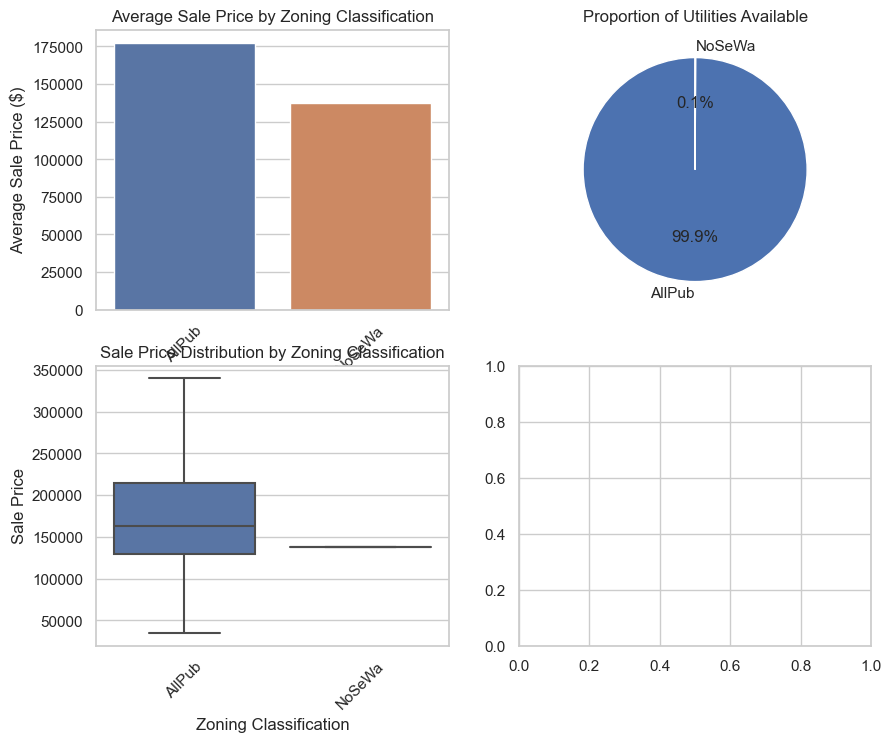

In [101]:
plotter('Utilities')

    LotConfig
        Describes the configuration of the lot.

        Inside: Lot inside a block
        Corner: Lot at the corner of two streets
        CulDSac: Lot at the end of a cul-de-sac
        FR2: Lot with a frontage on two streets
        FR3: Lot with a frontage on three streets
        
    Importance: Lot configuration can influence privacy, accessibility, and desirability, potentially 
    impacting property value based on the layout and location.



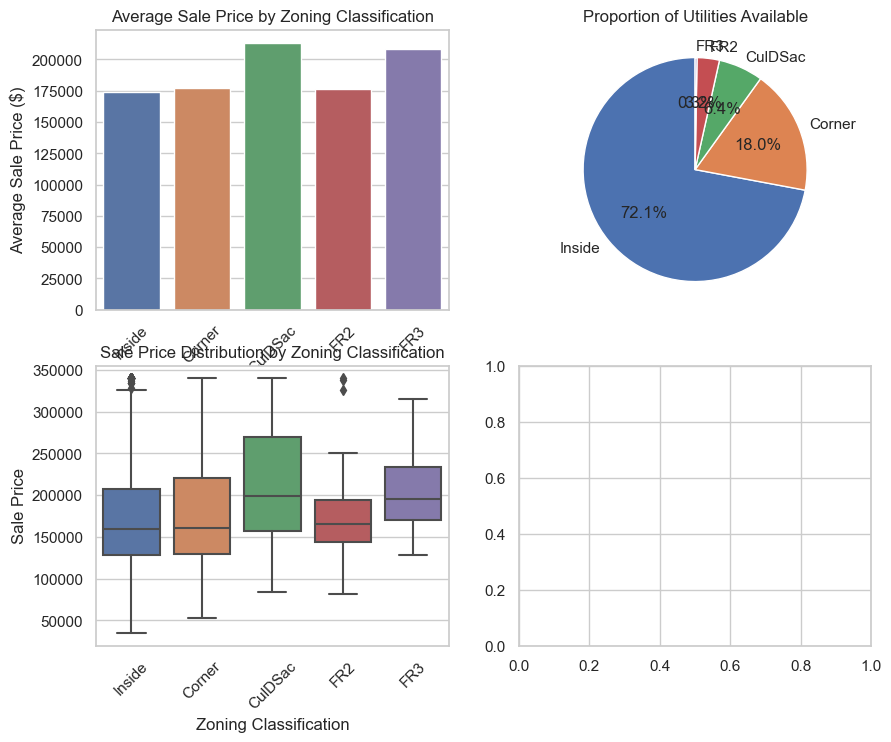

In [102]:
plotter('LotConfig')

    Functional
        Rates the functionality of the home.

        Typ: Typical Functionality
        Min1: Minor Deductions 1
        Min2: Minor Deductions 2
        Mod: Moderate Deductions
        Sev: Severely Lacking Functionality
        
    Importance: This rating can affect buyer perceptions of livability and overall property value, making
    it a relevant variable for modeling.

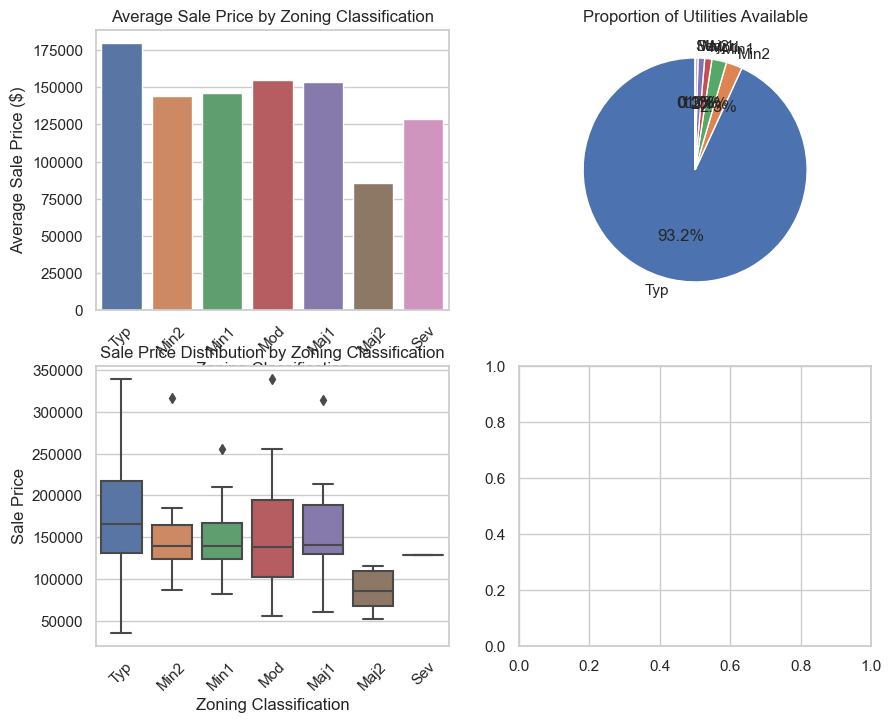

In [103]:
plotter('Functional')

    KitchenQual
        Rates the quality of the kitchen.

        Ex: Excellent
        Gd: Good
        TA: Average/Typical
        Fa: Fair
        Po: Poor
        
    Importance: Kitchen quality can heavily influence buyer interest and property value, as the kitchen is 
    often a focal point in home buying decisions.

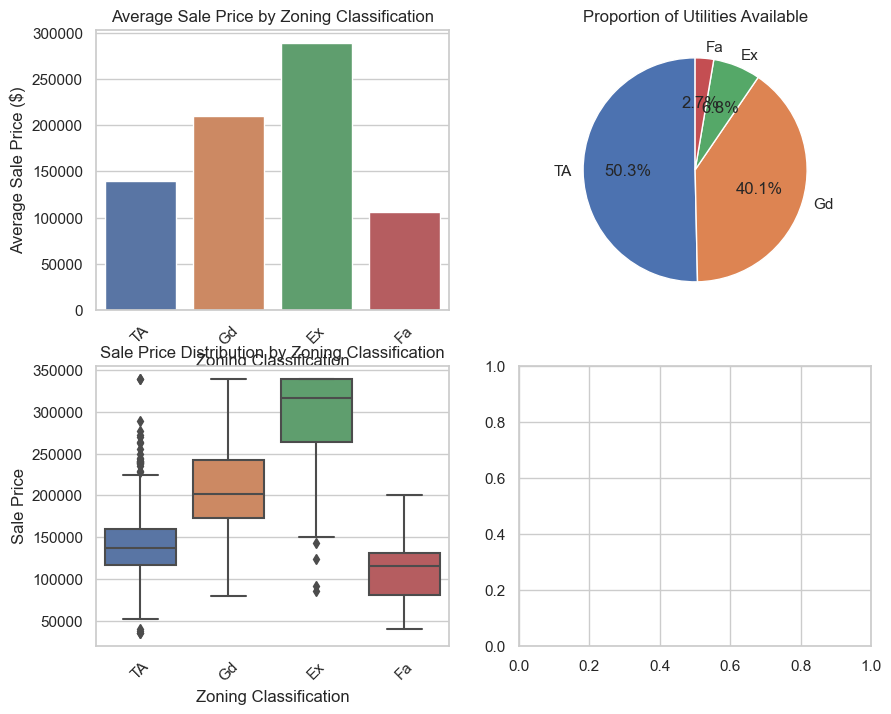

In [104]:
plotter('KitchenQual')

    GarageQual
        Rates the quality of the garage.

        Ex: Excellent
        Gd: Good
        TA: Average/Typical
        Fa: Fair
        Po: Poor
        NA: No garage
        
    Importance: Similar to other quality ratings, garage quality can affect buyer perceptions and property valuation.



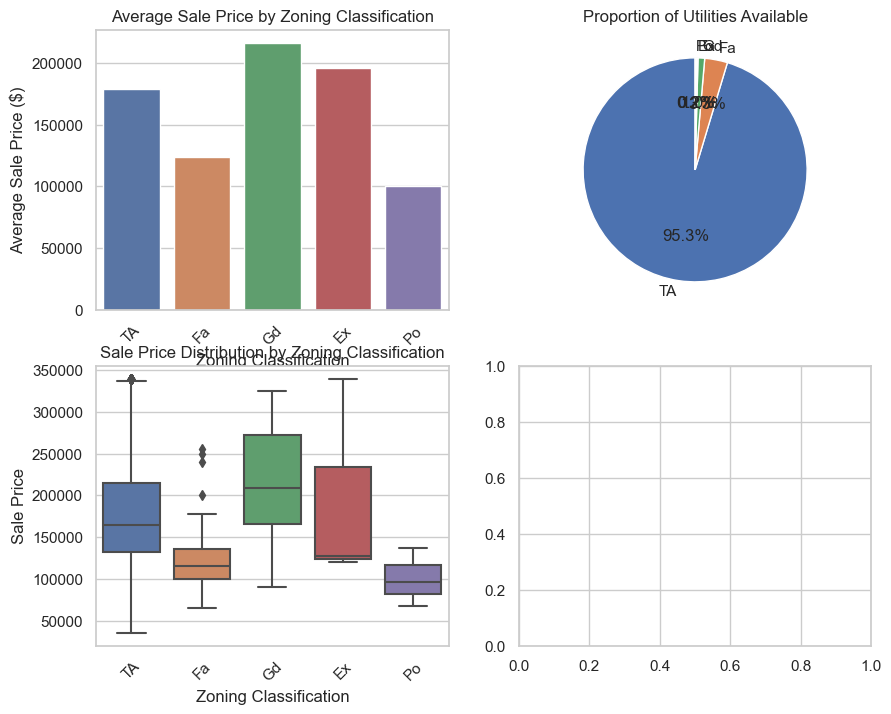

In [105]:
plotter('GarageQual')

    GarageCond
        Rates the condition of the garage.

        Ex: Excellent
        Gd: Good
        TA: Average/Typical
        Fa: Fair
        Po: Poor
        NA: No garage
        
    Importance: The condition of the garage can influence overall property value and buyer interest, 
    particularly in markets where garage space is highly sought after.

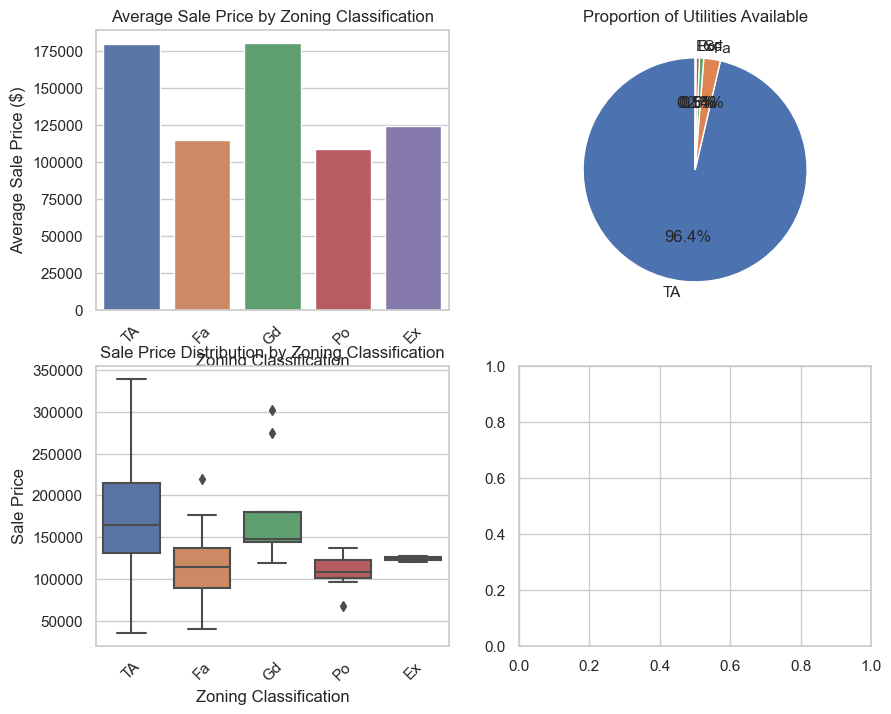

In [106]:
plotter('GarageCond')

    And other all more....
    
    So decided some few columns above all :

In [107]:
cat_vars = cat_vars[['Neighborhood', 'KitchenQual', 'CentralAir']]

In [108]:
cat_vars = pd.get_dummies(cat_vars, dtype = int, drop_first = True)
cat_vars

,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,CentralAir_Y
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1
2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1456,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1457,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
1458,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1


    >>> Libraries for buliding Model.

In [109]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

In [110]:
train_df = pd.concat([num_vars, cat_vars], axis = 1)
train_df

,SalePrice,OverallQual,OverallCond,GrLivArea,YearBuilt,TotalBsmtSF,FullBath,BedroomAbvGr,GarageCars,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,CentralAir_Y
0,208500.00,7,5.00,1710.00,2003,856,2,3.00,2.00,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
1,181500.00,6,7.50,1262.00,1976,1262,2,3.00,2.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1
2,223500.00,7,5.00,1786.00,2001,920,2,3.00,2.00,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
3,140000.00,7,5.00,1717.00,1915,756,1,3.00,3.00,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
4,250000.00,8,5.00,2198.00,2000,1145,2,4.00,3.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,175000.00,6,5.00,1647.00,1999,953,2,3.00,2.00,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1456,210000.00,6,6.00,2073.00,1978,1542,2,3.00,2.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1457,266500.00,7,7.50,2340.00,1941,1152,2,4.00,1.00,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
1458,142125.00,5,6.00,1078.00,1950,1078,1,2.00,1.00,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1


##### Linear Regression! 

In [111]:
x_train = train_df.drop(columns = 'SalePrice')
y_train = train_df['SalePrice']

In [112]:
regression = LinearRegression()
regression

LinearRegression()

In [113]:
model = regression.fit(x_train, y_train)

In [114]:
y_train_pred = regression.predict(x_train)

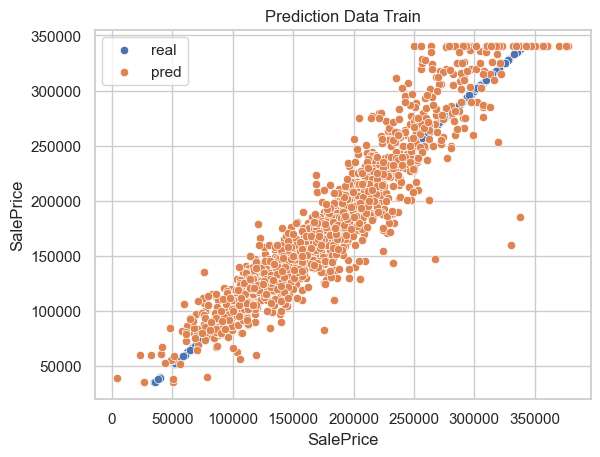

In [115]:
sns.scatterplot(x = y_train, y = y_train, label = 'real')
sns.scatterplot(x = y_train_pred, y = y_train, label = 'pred')
plt.title('Prediction Data Train')
plt.legend()
plt.show()

In [116]:
mse = mean_squared_error(y_train, y_train_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.884
Mean Squared Error (MSE) 	:523931907.874
Root Mean Squared Error (RMSE)	:22889.559
Mean Absolute Error (MAE) 	:16332.463


##### Decesion Tree!

In [117]:
x_train = train_df.drop(columns = 'SalePrice')
y_train = train_df['SalePrice']

In [118]:
dt_rgs = DecisionTreeRegressor()

hyp_grid = {
    'max_depth' : np.arange(3, 15),
    'min_samples_split' : np.arange(2, 20),
    'min_samples_leaf' : np.arange(1, 20)
}

model_2 = GridSearchCV(dt_rgs, hyp_grid, cv = 5)

In [119]:
model_2.fit(x_train, y_train)
model_2.best_estimator_

DecisionTreeRegressor(max_depth=10, min_samples_leaf=7, min_samples_split=16)

In [120]:
decision = DecisionTreeRegressor(max_depth=10, min_samples_leaf=7, min_samples_split=16)
decision.fit(x_train, y_train)
decision

DecisionTreeRegressor(max_depth=10, min_samples_leaf=7, min_samples_split=16)

In [121]:
y_train_pred = decision.predict(x_train)

In [122]:
mse = mean_squared_error(y_train, y_train_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.905
Mean Squared Error (MSE) 	:427017127.202
Root Mean Squared Error (RMSE)	:20664.393
Mean Absolute Error (MAE) 	:14737.124


    >>>> Artificial Neural Network!

    We import all the necessary libraries to develop the model, such as:

        1. Pandas, NumPy, Seaborn: For data analysis, transformation, and visualization.
        2. Keras: A library needed to create the neural network.
        3. PyTorch: A library for advanced neural networks.
        4. Scikit-learn (Sklearn): A library for machine learning.


In [123]:
pip install torch torchvision torchaudio

Note: you may need to restart the kernel to use updated packages.


In [124]:
import torch
print(torch.__version__)

2.2.2


In [125]:
from torch import nn, optim
import torch
from random import choice
from keras import layers, models
from keras.optimizers import Adam, AdamW, RMSprop, SGD, Adadelta, Nadam, Lion, Ftrl
from keras.callbacks import EarlyStopping
from keras.metrics import RootMeanSquaredError
from sklearn.preprocessing import LabelEncoder, Normalizer, StandardScaler

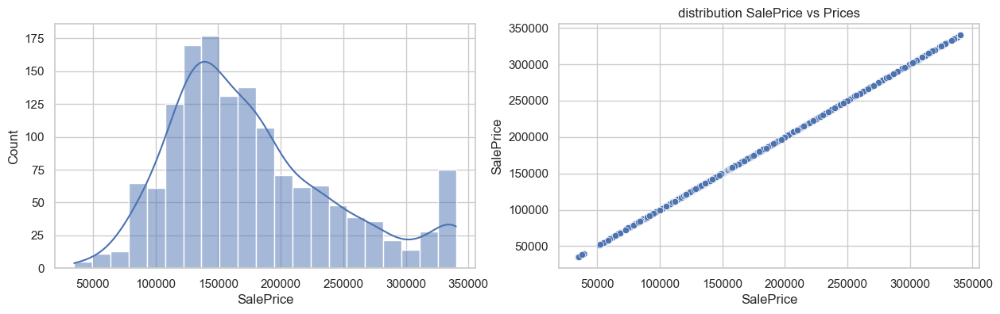

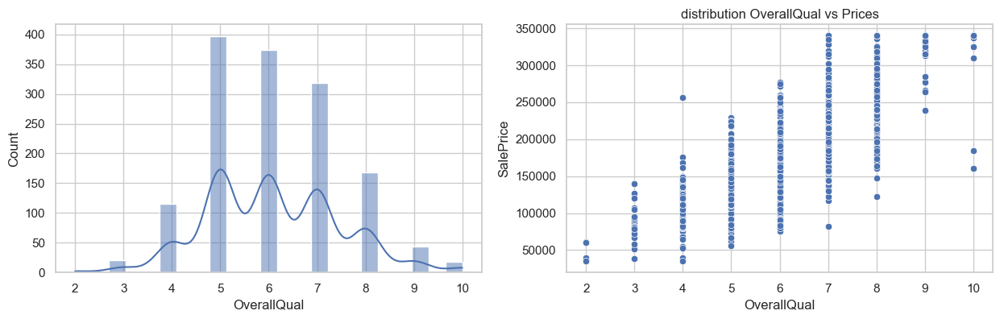

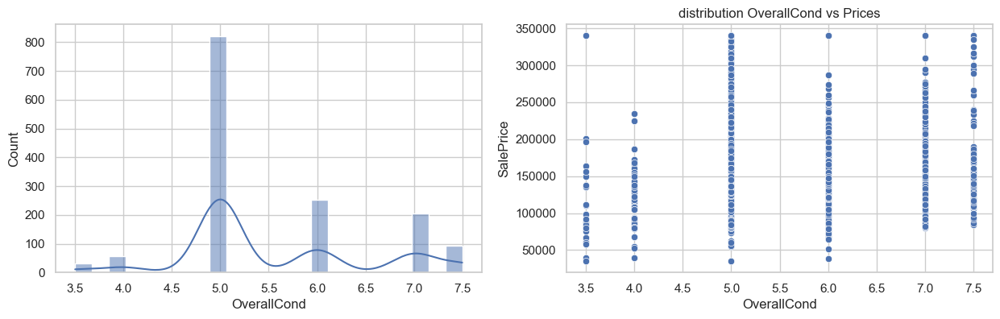

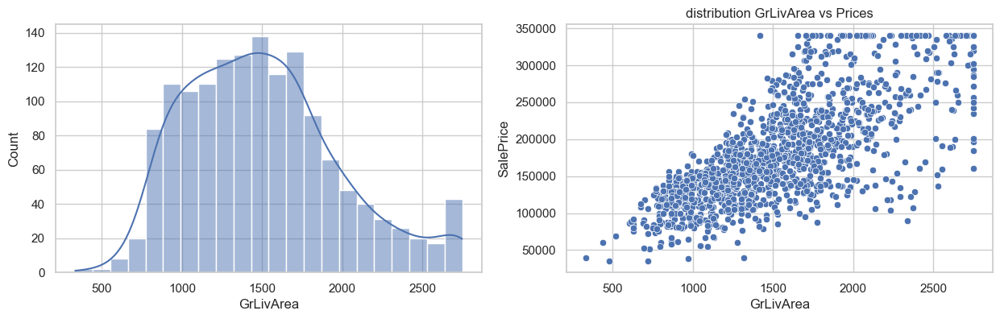

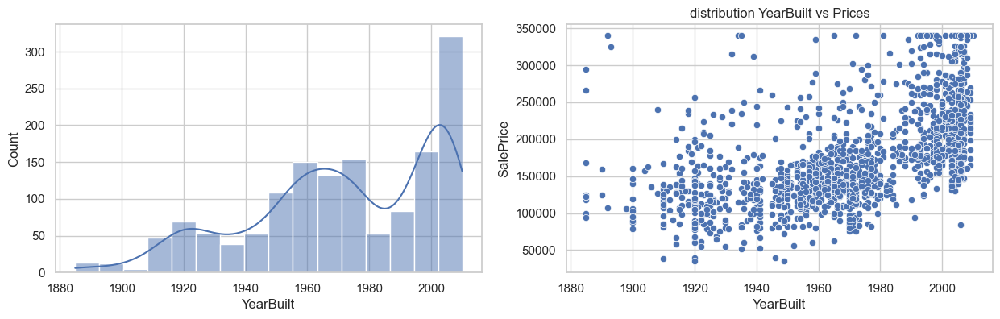

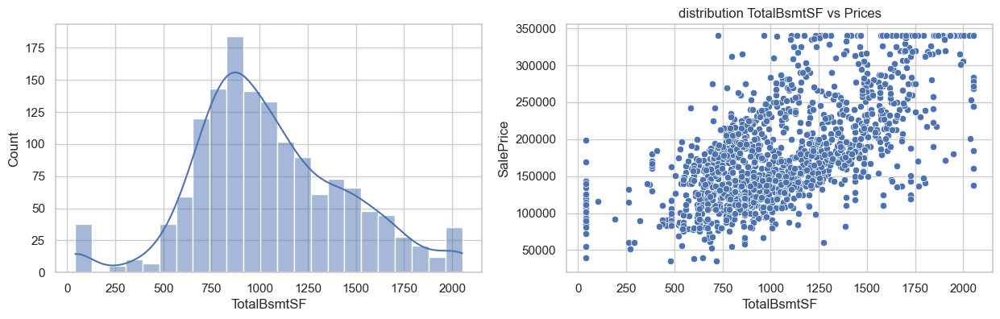

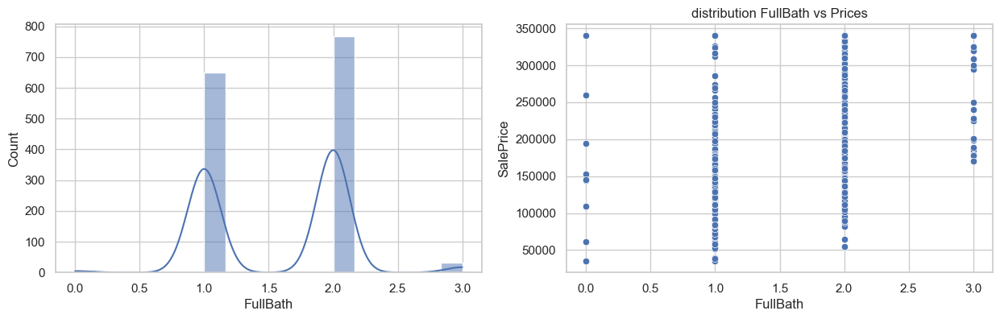

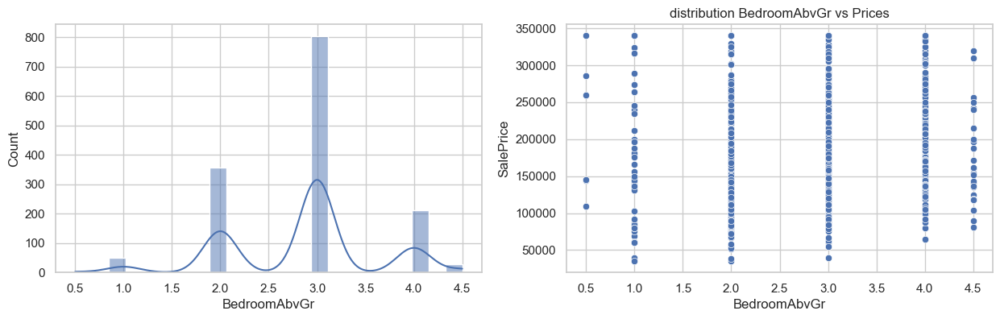

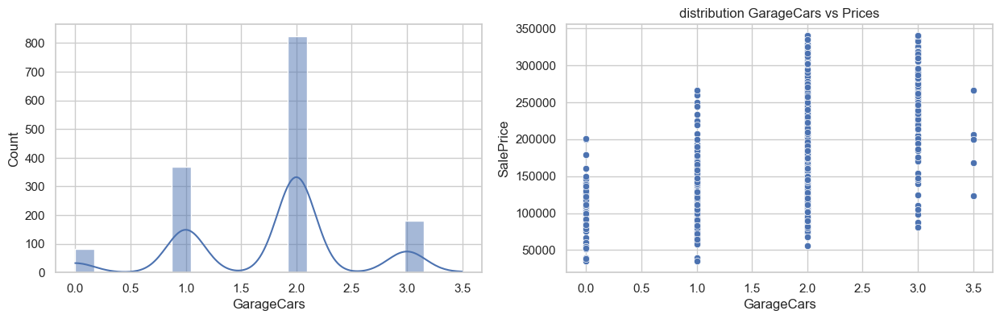

In [126]:
for n, col in enumerate(num_vars):
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    sns.histplot(num_vars[col], kde=True)
    plt.xlabel(col)
    plt.subplot(1,2,2)
    sns.scatterplot(num_vars,x=col, y='SalePrice')
    plt.title(f'distribution {col} vs Prices')
plt.show()

In [127]:
X_train = train_df.drop(columns = ['SalePrice'])
y_train = train_df['SalePrice']

In [128]:
model = models.Sequential()

    Input Layer:          Dense(512, activation='relu', input_shape=(number_of_features,))
                         (first hidden layer)

    Hidden Layer 1:      Dense(512, activation='relu')
                         Dropout(0.25)

    Hidden Layer 2:      Dense(256, activation='relu')
                         Dropout(0.25)

    Hidden Layer 3:      Dense(128, activation='relu')
                         Dropout(0.25)

    Output Layer:        Dense(1)  # Producing a single output value


In [129]:
# Input Layer of the Model
model.add(layers.Dense(512, activation = 'relu', input_shape = (X_train.shape[1],)))   # First hidden layer with 512 neurons
model.add(layers.Dropout(0.25))                                                    # Dropout layer to prevent overfitting

# Hidden Layer of the Model
model.add(layers.Dense(256,activation = 'relu'))                                     # Second hidden layer with 256 neurons
model.add(layers.Dropout(0.25))                                                    # Dropout layer

model.add(layers.Dense(128,activation = 'relu'))                                     # Third hidden layer with 128 neurons
model.add(layers.Dropout(0.25))                                                    # Dropout layer

# Output Layer of the Model
model.add(layers.Dense(1))    

In [130]:
model.compile(optimizer = Lion(learning_rate = 0.001), loss = 'mae')
history = model.fit(X_train, y_train, epochs = 150, batch_size = 32, validation_split = 0.20)   

Epoch 1/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 167975.5312 - val_loss: 45890.3477
Epoch 2/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 45190.9766 - val_loss: 35696.3125
Epoch 3/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 34440.7656 - val_loss: 31452.1055
Epoch 4/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 29571.6270 - val_loss: 31574.1191
Epoch 5/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 33189.0625 - val_loss: 31028.9219
Epoch 6/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 32111.8574 - val_loss: 30938.3965
Epoch 7/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 31439.7559 - val_loss: 30926.1191
Epoch 8/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 33146.4531 - val_loss: 30289.8535
Epoch 9/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 31614.9277 - val_loss: 34599.0898
Epoch 10/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 32528.3477 - val_loss: 30574.3086
Epoch 11/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 32312.8

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 26741.5820 - val_loss: 24046.4824
Epoch 66/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 26828.4844 - val_loss: 29796.4629
Epoch 67/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 30414.6582 - val_loss: 22346.3457
Epoch 68/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 30067.0293 - val_loss: 21994.8008
Epoch 69/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 28400.3223 - val_loss: 22025.4355
Epoch 70/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 28786.5645 - val_loss: 22037.8516
Epoch 71/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 29959.7930 - val_loss: 22844.3262
Epoch 72/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 29277.9824 - val_loss: 22316.2422
Epoch 73/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 27334.4492 - val_loss: 21913.7148
Epoch 74/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 30301.4141 - val_loss: 21432.1289
Epoch 75/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 27298.9512 -

Epoch 129/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 29376.1953 - val_loss: 23001.5059
Epoch 130/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 30222.7441 - val_loss: 21960.5449
Epoch 131/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 29754.3047 - val_loss: 26299.6406
Epoch 132/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 30001.2930 - val_loss: 30910.3086
Epoch 133/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 30045.7910 - val_loss: 31348.7148
Epoch 134/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 29501.6836 - val_loss: 27201.5391
Epoch 135/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 28140.0156 - val_loss: 23598.4277
Epoch 136/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 28525.1895 - val_loss: 26148.7754
Epoch 137/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 29607.9199 - val_loss: 27942.7148
Epoch 138/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 29079.4414 - val_loss: 29975.7578
Epoch 139/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/st

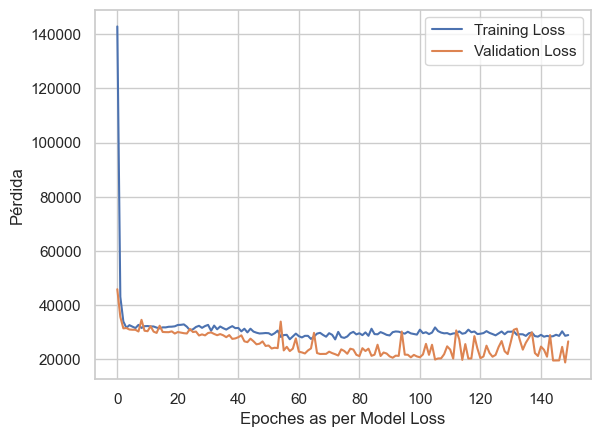

In [131]:
plt.plot(history.history['loss'], label = 'Training Loss')
plt.plot(history.history['val_loss'], label = 'Validation Loss')
plt.xlabel('Epoches as per Model Loss')
plt.ylabel('Pérdida')
plt.legend()
plt.show()

In [132]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
    x = list(range(1, len(history.history['loss']) + 1)),  # Epochs
    y = history.history['loss'],
    mode = 'lines+markers',
    name = 'Training Loss',
    line = dict(color = 'red'),
    marker = dict(symbol = 'circle')
))

fig.add_trace(
    go.Scatter(
    x = list(range(1, len(history.history['val_loss']) + 1)),  # Epochs
    y = history.history['val_loss'],
    mode = 'lines+markers',
    name = 'Validation Loss',
    line = dict(color = 'green'),
    marker = dict(symbol = 'circle')
))

fig.update_layout(
    title = 'Model Loss',
    xaxis_title = 'Epochs',
    yaxis_title = 'Loss',
    legend_title = 'Loss Type',
    template = 'plotly'
)
fig.show()

##### MODEL DEEP LEARNING (PYTORCH)

In [133]:
x_train = train_df.drop(columns = ['SalePrice'])
y_train = train_df['SalePrice']

In [134]:
# Convert DataFrame to NumPy array
x_train_np = x_train.values
y_train_np = y_train.values

# Now create tensors from NumPy arrays
x_train_tensor = torch.tensor(x_train_np, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_np, dtype=torch.float32)

In [135]:
class RegressionModel(nn.Module):
    def __init__(self):
        super(RegressionModel, self).__init__()
        self.fc1 = nn.Linear(X_train.shape[1], 512)  # First fully connected layer
        self.drop1 = nn.Dropout(0.2)  # Dropout layer with 20% probability
        self.fc2 = nn.Linear(512, 256)  # Second fully connected layer
        self.drop2 = nn.Dropout(0.2)  # Dropout layer
        self.fc3 = nn.Linear(256, 128)  # Third fully connected layer
        self.drop3 = nn.Dropout(0.2)  # Dropout layer
        self.fc4 = nn.Linear(128, 1)  # Output layer with one unit (for regression)

    def forward(self, x):
        x = torch.relu(self.fc1(x))  # Activation function for first layer
        x = self.drop1(x)  # Apply dropout
        x = torch.relu(self.fc2(x))  # Activation for second layer
        x = self.drop2(x)  # Apply dropout
        x = torch.relu(self.fc3(x))  # Activation for third layer
        x = self.drop3(x)  # Apply dropout
        x = self.fc4(x)  # Output layer (no activation for regression)
        return x


In [136]:
model = RegressionModel()
criterion = nn.L1Loss(reduction = 'mean')
optimizer = optim.Adam(model.parameters(), lr = 0.0001)

In [137]:
num_epochs = 200
batch_size = 32
num_batches = len(x_train_tensor) // batch_size
history = {'loss': [], 'val_loss': []}

for epoch in range(num_epochs):
    model.train()
    for i in range(num_batches):
        start = i * batch_size
        end = start + batch_size
        x_batch = x_train_tensor[start:end]
        y_batch = y_train_tensor[start:end]

        # Zero gradients, forward pass, compute loss, backward pass, optimize
        optimizer.zero_grad()  # Clear previous gradients
        outputs = model(x_batch)  # Forward pass
        loss = criterion(outputs, y_batch)  # Compute loss
        loss.backward()  # Backward pass
        optimizer.step()  # Update weights

    # Evaluate on the validation set
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():  # No gradient computation
        val_outputs = model(x_train_tensor)  # Forward pass on validation data
        val_loss = criterion(val_outputs, y_train_tensor)  # Compute validation loss

    # Store the loss values
    history['loss'].append(loss.item())  # Training loss
    history['val_loss'].append(val_loss.item())  # Validation loss

    if (epoch + 1) % 10 == 0:  # Print loss every 10 epochs
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}')


Epoch [10/200], Loss: 52372.1133, Val Loss: 54423.2812
Epoch [20/200], Loss: 51137.4219, Val Loss: 52748.7891
Epoch [30/200], Loss: 50707.1797, Val Loss: 52163.0859
Epoch [40/200], Loss: 50466.9688, Val Loss: 52050.2617
Epoch [50/200], Loss: 50670.7188, Val Loss: 52035.2461
Epoch [60/200], Loss: 50542.3906, Val Loss: 52056.3359
Epoch [70/200], Loss: 50545.9297, Val Loss: 52000.6445
Epoch [80/200], Loss: 50497.5000, Val Loss: 52030.0234
Epoch [90/200], Loss: 50341.5586, Val Loss: 52009.2891
Epoch [100/200], Loss: 50436.0039, Val Loss: 52025.3320
Epoch [110/200], Loss: 50713.3086, Val Loss: 52004.4258
Epoch [120/200], Loss: 50509.1367, Val Loss: 52000.2227
Epoch [130/200], Loss: 50763.1211, Val Loss: 52035.2266
Epoch [140/200], Loss: 50148.4102, Val Loss: 52030.0078
Epoch [150/200], Loss: 50896.0117, Val Loss: 52018.5977
Epoch [160/200], Loss: 50493.3789, Val Loss: 52032.2031
Epoch [170/200], Loss: 50491.0273, Val Loss: 52016.6055
Epoch [180/200], Loss: 50612.5664, Val Loss: 52007.7500
E

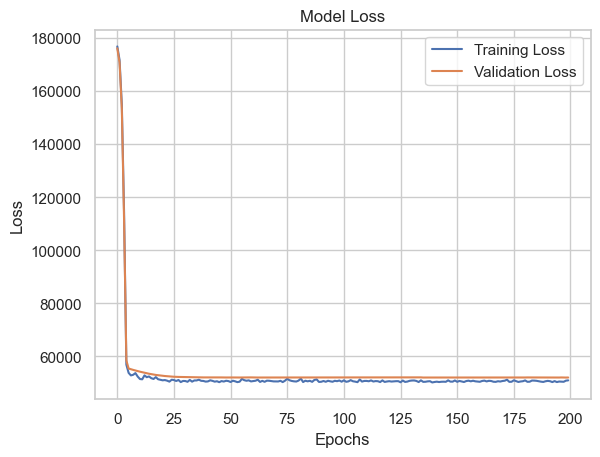

In [138]:
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

####  Feeding Sale Price Test Data. 

In [139]:
test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80,11622,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,0,TA,TA,CBlock,TA,TA,No,Rec,468.00,LwQ,144.00,270.00,882.00,GasA,TA,Y,SBrkr,896,0,0,896,0.00,0.00,1,0,2,1,TA,5,Typ,0,Attchd,1961.00,Unf,1.00,730.00,TA,TA,Y,140,0,0,0,120,0,0,6,2010,WD,Normal
1,1462,20,RL,81,14267,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,108,TA,TA,CBlock,TA,TA,No,ALQ,923.00,Unf,0.00,406.00,1329.00,GasA,TA,Y,SBrkr,1329,0,0,1329,0.00,0.00,1,1,3,1,Gd,6,Typ,0,Attchd,1958.00,Unf,1.00,312.00,TA,TA,Y,393,36,0,0,0,0,12500,6,2010,WD,Normal
2,1463,60,RL,74,13830,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,0,TA,TA,PConc,Gd,TA,No,GLQ,791.00,Unf,0.00,137.00,928.00,GasA,Gd,Y,SBrkr,928,701,0,1629,0.00,0.00,2,1,3,1,TA,6,Typ,1,Attchd,1997.00,Fin,2.00,482.00,TA,TA,Y,212,34,0,0,0,0,0,3,2010,WD,Normal
3,1464,60,RL,78,9978,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,20,TA,TA,PConc,TA,TA,No,GLQ,602.00,Unf,0.00,324.00,926.00,GasA,Ex,Y,SBrkr,926,678,0,1604,0.00,0.00,2,1,3,1,Gd,7,Typ,1,Attchd,1998.00,Fin,2.00,470.00,TA,TA,Y,360,36,0,0,0,0,0,6,2010,WD,Normal
4,1465,120,RL,43,5005,Pave,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,0,Gd,TA,PConc,Gd,TA,No,ALQ,263.00,Unf,0.00,1017.00,1280.00,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.00,0.00,2,0,2,1,Gd,5,Typ,0,Attchd,1992.00,RFn,2.00,506.00,TA,TA,Y,0,82,0,0,144,0,0,1,2010,WD,Normal


In [152]:
id_val = test_df['Id']

In [141]:
test_num = test_df[['OverallQual', 'OverallCond', 'GrLivArea', 'YearBuilt', 'TotalBsmtSF', 'FullBath', 'BedroomAbvGr', 'GarageCars']]
test_cat = test_df[['Neighborhood', 'KitchenQual', 'CentralAir']]

In [142]:
cat_test = pd.get_dummies(test_cat, dtype = int, drop_first = True)
cat_test

,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,CentralAir_Y
0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1455,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1456,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1457,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1


In [143]:
test_df = pd.concat([test_num, cat_test], axis = 1)
test_df

,OverallQual,OverallCond,GrLivArea,YearBuilt,TotalBsmtSF,FullBath,BedroomAbvGr,GarageCars,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,CentralAir_Y
0,5,6,896,1961,882.00,1,2,1.00,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1,6,6,1329,1958,1329.00,1,3,1.00,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
2,5,5,1629,1997,928.00,2,3,2.00,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
3,6,6,1604,1998,926.00,2,3,2.00,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
4,8,5,1280,1992,1280.00,2,2,2.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,4,7,1092,1970,546.00,1,3,0.00,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1455,4,5,1092,1970,546.00,1,3,1.00,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1456,5,7,1224,1960,1224.00,1,4,2.00,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1457,5,5,970,1992,912.00,1,3,0.00,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1


In [150]:
test_predict = regression.predict(test_df)

In [145]:
test_predict

array([115861.61158313, 163071.12745278, 173164.72959518, ...,
       154489.08534768, 110122.92820598, 214129.95899268])

In [147]:
test_df['SalePricePredicted'] = test_predict

In [153]:
test_df.head()

,OverallQual,OverallCond,GrLivArea,YearBuilt,TotalBsmtSF,FullBath,BedroomAbvGr,GarageCars,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,CentralAir_Y,SalePricePredicted
0,5,6,896,1961,882.00,1,2,1.00,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,115861.61
1,6,6,1329,1958,1329.00,1,3,1.00,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,163071.13
2,5,5,1629,1997,928.00,2,3,2.00,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,173164.73
3,6,6,1604,1998,926.00,2,3,2.00,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,196616.18
4,8,5,1280,1992,1280.00,2,2,2.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,224336.19


In [165]:
test_df.insert(0, 'Id', id_val)
test_df[['Id', 'SalePricePredicted']]

,Id,SalePricePredicted
0,1461,115861.61
1,1462,163071.13
2,1463,173164.73
3,1464,196616.18
4,1465,224336.19
...,...,...
1454,2915,91831.88
1455,2916,84778.53
1456,2917,154489.09
1457,2918,110122.93


####  Thnks For Exploraring this.